In [ ]:
!pip install pybaseball

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.1/426.1 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 432.7/432.7 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 24.6 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import math
import pybaseball

In [ ]:
# mount drive to access .csv files
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [ ]:
data = pd.read_csv('./drive/MyDrive/Case comp/pbp2023-24.csv')

In [ ]:
data_rel = data[data['inning'] >= 9]

In [ ]:
data_rel_sorted = data_rel.sort_values(by=['game_pk', 'at_bat_number', 'pitch_number'])

In [ ]:
data_rel_firstpitch = data_rel_sorted.groupby(['game_pk', 'pitcher', 'inning']).first().reset_index()
data_rel_lastpitch = data_rel_sorted.groupby(['game_pk']).last().reset_index()
data_rel_lastpitch['winner'] = data_rel_lastpitch.apply(
    lambda row: 'H' if row['post_home_score'] > row['post_away_score'] else 'A', axis=1)

In [ ]:
data_rel_lastpitch_winners =  data_rel_lastpitch[((data_rel_lastpitch['winner'] == 'H') & (data_rel_lastpitch['inning_topbot'] == 'Top')) | ((data_rel_lastpitch['winner'] == 'A') & (data_rel_lastpitch['inning_topbot'] == 'Bot'))]

In [ ]:
data_rel_firstpitch = data_rel_firstpitch.merge(
    data_rel_lastpitch_winners[['game_pk', 'player_name', 'inning']],  # Selecting relevant columns
    on='game_pk',
    how='left',
    suffixes=('', '_lastpitch')  # Adding a suffix to distinguish the new column
)

In [ ]:
data_rel_firstpitch

,game_pk,pitcher,inning,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,...,pitcher_days_since_prev_game,batter_days_since_prev_game,pitcher_days_until_next_game,batter_days_until_next_game,api_break_z_with_gravity,api_break_x_arm,api_break_x_batter_in,arm_angle,player_name_lastpitch,inning_lastpitch
0,716352,663704,9,SI,2023-10-01,94.7,-2.54,5.64,"McArthur, James",665828,...,2.0,1.0,NaN,NaN,2.25,1.30,-1.30,28.6,"McArthur, James",9.0
1,716353,664854,9,FF,2023-10-01,99.2,-0.51,6.01,"Helsley, Ryan",687952,...,5.0,1.0,NaN,NaN,0.78,0.28,0.28,55.2,"Helsley, Ryan",9.0
2,716354,543859,9,ST,2023-10-01,79.9,-3.82,5.29,"Tonkin, Michael",660688,...,4.0,1.0,10.0,NaN,3.59,-1.81,1.81,10.7,"Finnegan, Kyle",9.0
3,716354,640448,9,FF,2023-10-01,96.5,-2.00,5.77,"Finnegan, Kyle",670032,...,2.0,2.0,NaN,6.0,1.09,0.82,-0.82,45.6,"Finnegan, Kyle",9.0
4,716355,547179,9,SL,2023-10-01,89.0,-1.65,5.71,"Lorenzen, Michael",542364,...,3.0,1.0,10.0,NaN,2.86,-0.19,0.19,42.0,"Lorenzen, Michael",9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9482,747221,664875,9,SI,2024-03-30,95.5,-3.16,4.27,"Lawrence, Justin",682998,...,NaN,1.0,6.0,1.0,2.26,1.35,-1.35,-4.9,"Lawrence, Justin",9.0
9483,747221,669459,9,SL,2024-03-30,82.0,0.90,5.81,"Nelson, Kyle",666134,...,2.0,1.0,2.0,1.0,3.05,-0.39,-0.39,42.2,"Lawrence, Justin",9.0
9484,747222,656464,9,FF,2024-03-31,95.5,-2.30,6.32,"Ginkel, Kevin",641857,...,2.0,1.0,3.0,1.0,1.36,0.97,-0.97,34.8,"Ginkel, Kevin",9.0
9485,747223,656464,9,FF,2024-03-29,96.4,-2.31,6.28,"Ginkel, Kevin",666134,...,NaN,1.0,2.0,1.0,1.21,0.80,-0.80,38.1,"Ginkel, Kevin",9.0


In [ ]:
data_rel_firstpitch[data_rel_firstpitch['player_name_lastpitch'].isna()]

,game_pk,pitcher,inning,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,...,pitcher_days_since_prev_game,batter_days_since_prev_game,pitcher_days_until_next_game,batter_days_until_next_game,api_break_z_with_gravity,api_break_x_arm,api_break_x_batter_in,arm_angle,player_name_lastpitch,inning_lastpitch
17,716359,571863,10,FF,2023-10-01,91.2,-2.56,5.97,"Koch, Matt",663616,...,1.0,1.0,NaN,2.0,1.35,0.85,-0.85,37.5,NaN,NaN
18,716359,641755,9,FF,2023-10-01,96.1,-0.87,6.54,"Kinley, Tyler",664057,...,2.0,1.0,NaN,2.0,1.20,0.42,-0.42,43.1,NaN,NaN
19,716359,656669,11,FA,2023-10-01,73.0,-2.36,6.01,"Luplow, Jordan",453568,...,51.0,1.0,NaN,NaN,2.90,0.70,-0.70,28.5,NaN,NaN
20,716359,660896,9,FF,2023-10-01,95.3,-2.81,6.61,"Alcala, Jorge",453568,...,140.0,1.0,NaN,NaN,1.36,0.63,-0.63,43.2,NaN,NaN
21,716359,668970,11,SI,2023-10-01,94.6,-2.24,5.24,"Hollowell, Gavin",650489,...,2.0,1.0,NaN,2.0,2.08,1.08,-1.08,12.8,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9451,747210,656464,9,SI,2024-04-30,92.4,-2.40,6.39,"Ginkel, Kevin",571771,...,2.0,1.0,5.0,1.0,1.84,1.19,1.19,36.3,NaN,NaN
9464,747214,592767,10,SI,2024-04-16,93.1,1.37,6.65,"Smyly, Drew",545341,...,1.0,1.0,1.0,1.0,1.10,0.57,-0.57,52.4,NaN,NaN
9465,747214,612434,9,FF,2024-04-16,94.2,-2.40,4.92,"Castro, Miguel",666624,...,1.0,1.0,4.0,1.0,1.80,1.13,1.13,14.1,NaN,NaN
9466,747214,640470,9,FF,2024-04-16,96.0,-1.19,6.23,"Alzolay, Adbert",664983,...,2.0,1.0,4.0,2.0,1.09,0.69,-0.69,37.2,NaN,NaN


In [ ]:
data_rel_firstpitch.rename(columns={'player_name_lastpitch': 'save_maker', 'inning_lastpitch': 'last_inning'}, inplace=True)
data_rel_firstpitch

,game_pk,pitcher,inning,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,...,pitcher_days_since_prev_game,batter_days_since_prev_game,pitcher_days_until_next_game,batter_days_until_next_game,api_break_z_with_gravity,api_break_x_arm,api_break_x_batter_in,arm_angle,save_maker,last_inning
0,716352,663704,9,SI,2023-10-01,94.7,-2.54,5.64,"McArthur, James",665828,...,2.0,1.0,NaN,NaN,2.25,1.30,-1.30,28.6,"McArthur, James",9.0
1,716353,664854,9,FF,2023-10-01,99.2,-0.51,6.01,"Helsley, Ryan",687952,...,5.0,1.0,NaN,NaN,0.78,0.28,0.28,55.2,"Helsley, Ryan",9.0
2,716354,543859,9,ST,2023-10-01,79.9,-3.82,5.29,"Tonkin, Michael",660688,...,4.0,1.0,10.0,NaN,3.59,-1.81,1.81,10.7,"Finnegan, Kyle",9.0
3,716354,640448,9,FF,2023-10-01,96.5,-2.00,5.77,"Finnegan, Kyle",670032,...,2.0,2.0,NaN,6.0,1.09,0.82,-0.82,45.6,"Finnegan, Kyle",9.0
4,716355,547179,9,SL,2023-10-01,89.0,-1.65,5.71,"Lorenzen, Michael",542364,...,3.0,1.0,10.0,NaN,2.86,-0.19,0.19,42.0,"Lorenzen, Michael",9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9482,747221,664875,9,SI,2024-03-30,95.5,-3.16,4.27,"Lawrence, Justin",682998,...,NaN,1.0,6.0,1.0,2.26,1.35,-1.35,-4.9,"Lawrence, Justin",9.0
9483,747221,669459,9,SL,2024-03-30,82.0,0.90,5.81,"Nelson, Kyle",666134,...,2.0,1.0,2.0,1.0,3.05,-0.39,-0.39,42.2,"Lawrence, Justin",9.0
9484,747222,656464,9,FF,2024-03-31,95.5,-2.30,6.32,"Ginkel, Kevin",641857,...,2.0,1.0,3.0,1.0,1.36,0.97,-0.97,34.8,"Ginkel, Kevin",9.0
9485,747223,656464,9,FF,2024-03-29,96.4,-2.31,6.28,"Ginkel, Kevin",666134,...,NaN,1.0,2.0,1.0,1.21,0.80,-0.80,38.1,"Ginkel, Kevin",9.0


In [ ]:
data_rel_firstpitch_withlead = data_rel_firstpitch[
    ((data_rel_firstpitch['home_score_diff'] > 0) &
     (data_rel_firstpitch['inning_topbot'] == 'Top')) |
    ((data_rel_firstpitch['home_score_diff'] < 0) &
     (data_rel_firstpitch['inning_topbot'] == 'Bot'))]
data_rel_firstpitch_withlead

,game_pk,pitcher,inning,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,...,pitcher_days_since_prev_game,batter_days_since_prev_game,pitcher_days_until_next_game,batter_days_until_next_game,api_break_z_with_gravity,api_break_x_arm,api_break_x_batter_in,arm_angle,save_maker,last_inning
0,716352,663704,9,SI,2023-10-01,94.7,-2.54,5.64,"McArthur, James",665828,...,2.0,1.0,NaN,NaN,2.25,1.30,-1.30,28.6,"McArthur, James",9.0
1,716353,664854,9,FF,2023-10-01,99.2,-0.51,6.01,"Helsley, Ryan",687952,...,5.0,1.0,NaN,NaN,0.78,0.28,0.28,55.2,"Helsley, Ryan",9.0
2,716354,543859,9,ST,2023-10-01,79.9,-3.82,5.29,"Tonkin, Michael",660688,...,4.0,1.0,10.0,NaN,3.59,-1.81,1.81,10.7,"Finnegan, Kyle",9.0
3,716354,640448,9,FF,2023-10-01,96.5,-2.00,5.77,"Finnegan, Kyle",670032,...,2.0,2.0,NaN,6.0,1.09,0.82,-0.82,45.6,"Finnegan, Kyle",9.0
4,716355,547179,9,SL,2023-10-01,89.0,-1.65,5.71,"Lorenzen, Michael",542364,...,3.0,1.0,10.0,NaN,2.86,-0.19,0.19,42.0,"Lorenzen, Michael",9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9481,747220,686826,9,FF,2024-04-02,97.5,-2.35,5.95,"Jarvis, Bryce",665742,...,3.0,1.0,4.0,1.0,1.17,0.72,-0.72,40.6,"Jarvis, Bryce",9.0
9482,747221,664875,9,SI,2024-03-30,95.5,-3.16,4.27,"Lawrence, Justin",682998,...,NaN,1.0,6.0,1.0,2.26,1.35,-1.35,-4.9,"Lawrence, Justin",9.0
9484,747222,656464,9,FF,2024-03-31,95.5,-2.30,6.32,"Ginkel, Kevin",641857,...,2.0,1.0,3.0,1.0,1.36,0.97,-0.97,34.8,"Ginkel, Kevin",9.0
9485,747223,656464,9,FF,2024-03-29,96.4,-2.31,6.28,"Ginkel, Kevin",666134,...,NaN,1.0,2.0,1.0,1.21,0.80,-0.80,38.1,"Ginkel, Kevin",9.0


In [ ]:
data_rel_firstpitch_withlead[data_rel_firstpitch_withlead['save_maker'].isna()]

,game_pk,pitcher,inning,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,...,pitcher_days_since_prev_game,batter_days_since_prev_game,pitcher_days_until_next_game,batter_days_until_next_game,api_break_z_with_gravity,api_break_x_arm,api_break_x_batter_in,arm_angle,save_maker,last_inning
67,716385,676961,9,CU,2023-09-29,74.5,-1.53,6.17,"Boushley, Caleb",664023,...,NaN,1.0,NaN,1.0,4.97,-1.04,1.04,49.3,NaN,NaN
86,716397,547973,9,FF,2023-09-28,97.9,0.43,5.99,"Chapman, Aroldis",663728,...,1.0,1.0,5.0,1.0,0.89,0.49,-0.49,47.1,NaN,NaN
88,716397,642546,9,SL,2023-09-28,86.7,-1.91,5.35,"Hernández, Jonathan",645801,...,3.0,1.0,3.0,1.0,2.83,-0.27,0.27,21.7,NaN,NaN
112,716412,643410,9,SI,2023-09-27,91.6,-1.65,5.93,"Leiter Jr., Mark",621566,...,7.0,1.0,2.0,1.0,1.72,1.17,-1.17,50.0,NaN,NaN
113,716412,694037,10,FF,2023-09-27,98.5,-2.54,5.60,"Palencia, Daniel",606115,...,3.0,1.0,4.0,1.0,0.94,1.03,1.03,37.6,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9362,747160,680767,9,FF,2024-08-13,99.3,-2.33,5.58,"Vodnik, Victor",553993,...,2.0,1.0,3.0,1.0,1.03,0.37,0.37,43.4,NaN,NaN
9379,747172,640448,9,FF,2024-07-29,97.3,-1.67,5.72,"Finnegan, Kyle",677950,...,3.0,1.0,5.0,1.0,1.06,0.83,-0.83,53.9,NaN,NaN
9436,747204,664747,9,FF,2024-05-13,94.8,-2.22,4.23,"Díaz, Alexis",666971,...,1.0,1.0,4.0,1.0,1.43,0.73,0.73,3.9,NaN,NaN
9450,747210,622503,10,CH,2024-04-30,82.0,-2.63,5.60,"Crismatt, Nabil",572233,...,2.0,1.0,12.0,1.0,3.04,0.68,0.68,34.1,NaN,NaN


In [ ]:
data_rel_firstpitch_withlead['pitch_win_exp'] = 1- data_rel_firstpitch_withlead['bat_win_exp']

<ipython-input-15-ba5dc2ba2d02>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_rel_firstpitch_withlead['pitch_win_exp'] = 1- data_rel_firstpitch_withlead['bat_win_exp']


In [ ]:
data_rel_firstpitch_withlead_sorted = data_rel_firstpitch_withlead.sort_values(by=['pitch_win_exp'], ascending=True)

In [ ]:
data_rel_firstpitch_withlead_sorted['op'] = 1
data_rel_firstpitch_withlead_sorted['weighted_save_op'] = (
    np.sqrt(data_rel_firstpitch_withlead_sorted['bat_win_exp'] /
    data_rel_firstpitch_withlead_sorted['bat_win_exp'].median())
)
data_rel_firstpitch_withlead_sorted['weighted_save'] = data_rel_firstpitch_withlead_sorted.apply(
    lambda row: row['weighted_save_op'] if ((row['player_name'] == row['save_maker']) and (row['inning'] == row['last_inning'])) else 0, axis=1)

In [ ]:
data_rel_firstpitch_withlead_sorted[['player_name', 'game_date', 'fld_score','bat_score', 'inning', 'inning_topbot', 'outs_when_up', 'balls', 'strikes', 'on_1b', 'on_2b', 'on_3b', 'pitch_win_exp', 'save_maker', 'op', 'weighted_save_op', 'weighted_save']]

,player_name,game_date,fld_score,bat_score,inning,inning_topbot,outs_when_up,balls,strikes,on_1b,on_2b,on_3b,pitch_win_exp,save_maker,op,weighted_save_op,weighted_save
8255,"Adam, Jason",2024-04-05,7,6,9,Bot,0,0,0,666134.0,663898.0,595909.0,0.269,NaN,1,4.385982,0.000000
88,"Hernández, Jonathan",2023-09-28,2,1,9,Bot,0,0,0,664034.0,664238.0,663728.0,0.269,NaN,1,4.385982,0.000000
4510,"Gibaut, Ian",2023-04-08,2,1,9,Bot,0,0,0,669016.0,669016.0,664761.0,0.357,NaN,1,4.113521,0.000000
4025,"Sims, Lucas",2023-04-26,3,2,9,Top,0,0,0,543257.0,543257.0,669352.0,0.462,NaN,1,3.762698,0.000000
3123,"Beeks, Jalen",2023-05-31,4,3,9,Bot,1,0,0,621550.0,621458.0,643565.0,0.470,"Beeks, Jalen",1,3.734618,3.734618
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1597,"Krehbiel, Joey",2023-08-01,13,3,9,Bot,0,0,0,NaN,NaN,NaN,1.000,"Krehbiel, Joey",1,0.000000,0.000000
665,"Hoeing, Bryan",2023-09-06,11,1,9,Top,0,0,0,518792.0,444482.0,NaN,1.000,"Hoeing, Bryan",1,0.000000,0.000000
4283,"Ortiz, Luis F.",2023-04-16,14,3,9,Bot,0,0,0,621028.0,NaN,NaN,1.000,"Ortiz, Luis F.",1,0.000000,0.000000
675,"Kerr, Ray",2023-09-05,8,0,9,Top,0,0,0,642215.0,NaN,NaN,1.000,"Kerr, Ray",1,0.000000,0.000000


In [ ]:
data_rel_firstpitch_withlead_sorted[(data_rel_firstpitch_withlead_sorted['weighted_save_op'] == data_rel_firstpitch_withlead_sorted['weighted_save_op'].quantile(1))]

,game_pk,pitcher,inning,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,...,api_break_z_with_gravity,api_break_x_arm,api_break_x_batter_in,arm_angle,save_maker,last_inning,pitch_win_exp,op,weighted_save_op,weighted_save
8255,746576,592094,9,ST,2024-04-05,80.2,-1.43,5.84,"Adam, Jason",592178,...,3.99,-1.13,-1.13,29.4,NaN,NaN,0.269,1,4.385982,0.0
88,716397,642546,9,SL,2023-09-28,86.7,-1.91,5.35,"Hernández, Jonathan",645801,...,2.83,-0.27,0.27,21.7,NaN,NaN,0.269,1,4.385982,0.0


In [ ]:
data_rel_firstpitch_withlead_sorted['game_year']

,game_year
8255,2024
88,2023
4510,2023
4025,2023
3123,2023
...,...
1597,2023
665,2023
4283,2023
675,2023


In [ ]:
data_weighted_saves = data_rel_firstpitch_withlead_sorted.groupby(['player_name','game_year', 'pitcher'])[
    ['op','weighted_save_op', 'weighted_save']].sum().reset_index()
data_weighted_saves_sorted = data_weighted_saves.sort_values(by='weighted_save', ascending=False)
data_weighted_saves_sorted[data_weighted_saves_sorted['game_year'] == 2024].head(10)

,player_name,game_year,pitcher,op,weighted_save_op,weighted_save
152,"Clase, Emmanuel",2024,661403,59,87.020801,79.547574
327,"Helsley, Ryan",2024,664854,58,89.320595,79.504308
246,"Finnegan, Kyle",2024,640448,51,68.693494,62.232933
907,"Yates, Kirby",2024,489446,42,60.158737,58.119645
795,"Suarez, Robert",2024,663158,52,64.588342,56.867373
384,"Iglesias, Raisel",2024,628452,49,63.586230,55.429242
305,"Hader, Josh",2024,623352,48,59.872753,54.427668
558,"Miller, Mason",2024,695243,41,61.169213,51.747934
367,"Holmes, Clay",2024,605280,45,65.246733,47.918284
207,"Díaz, Alexis",2024,664747,40,54.380768,46.455809


In [ ]:
data_weighted_saves_sorted[data_weighted_saves_sorted['game_year'] == 2023].head(10)

,player_name,game_year,pitcher,op,weighted_save_op,weighted_save
151,"Clase, Emmanuel",2023,661403,66,100.867999,72.078799
59,"Bednar, David",2023,670280,52,78.506675,66.051113
53,"Bautista, Félix",2023,642585,49,79.385267,64.450772
206,"Díaz, Alexis",2023,664747,46,70.230306,63.108629
198,"Doval, Camilo",2023,666808,53,76.251493,61.565111
883,"Williams, Devin",2023,642207,43,64.871913,59.732427
693,"Romano, Jordan",2023,605447,44,63.634923,57.212746
383,"Iglesias, Raisel",2023,628452,47,62.371343,55.339277
648,"Pressly, Ryan",2023,519151,52,67.099064,53.875851
730,"Sewald, Paul",2023,623149,45,59.146442,53.480966


In [ ]:
data.columns.to_list()

['pitch_type',
 'game_date',
 'release_speed',
 'release_pos_x',
 'release_pos_z',
 'player_name',
 'batter',
 'pitcher',
 'events',
 'description',
 'spin_dir',
 'spin_rate_deprecated',
 'break_angle_deprecated',
 'break_length_deprecated',
 'zone',
 'des',
 'game_type',
 'stand',
 'p_throws',
 'home_team',
 'away_team',
 'type',
 'hit_location',
 'bb_type',
 'balls',
 'strikes',
 'game_year',
 'pfx_x',
 'pfx_z',
 'plate_x',
 'plate_z',
 'on_3b',
 'on_2b',
 'on_1b',
 'outs_when_up',
 'inning',
 'inning_topbot',
 'hc_x',
 'hc_y',
 'tfs_deprecated',
 'tfs_zulu_deprecated',
 'umpire',
 'sv_id',
 'vx0',
 'vy0',
 'vz0',
 'ax',
 'ay',
 'az',
 'sz_top',
 'sz_bot',
 'hit_distance_sc',
 'launch_speed',
 'launch_angle',
 'effective_speed',
 'release_spin_rate',
 'release_extension',
 'game_pk',
 'fielder_2',
 'fielder_3',
 'fielder_4',
 'fielder_5',
 'fielder_6',
 'fielder_7',
 'fielder_8',
 'fielder_9',
 'release_pos_y',
 'estimated_ba_using_speedangle',
 'estimated_woba_using_speedangle',
 'w

In [ ]:
data = data.sort_values(['game_date', 'at_bat_number', 'pitch_number'])
pa_data = data.groupby(['game_date', 'batter', 'pitcher', 'at_bat_number']).tail(1).copy()

pa_data['on_1b'] = pa_data['on_1b'].fillna(0).astype(bool)
pa_data['on_2b'] = pa_data['on_2b'].fillna(0).astype(bool)
pa_data['on_3b'] = pa_data['on_3b'].fillna(0).astype(bool)

conditions = [
    (~pa_data['on_1b'] & ~pa_data['on_2b'] & ~pa_data['on_3b']),
    (pa_data['on_1b'] & ~pa_data['on_2b'] & ~pa_data['on_3b']),
    (pa_data['on_1b'] & pa_data['on_2b'] & ~pa_data['on_3b']),
    (pa_data['on_1b'] & ~pa_data['on_2b'] & pa_data['on_3b']),
    (~pa_data['on_1b'] & pa_data['on_2b'] & pa_data['on_3b']),
    (~pa_data['on_1b'] & pa_data['on_2b'] & ~pa_data['on_3b']),
    (~pa_data['on_1b'] & ~pa_data['on_2b'] & pa_data['on_3b']),
    (pa_data['on_1b'] & pa_data['on_2b'] & pa_data['on_3b']),
]
labels = ['EMPTY', '1B', '1B2B', '1B3B', '2B3B', '2B', '3B', 'LOADED']

pa_data['base_state'] = pd.Series(index=pa_data.index, dtype="string")
for cond, label in zip(conditions, labels):
    pa_data.loc[cond, 'base_state'] = label
pa_data['situation'] = pa_data['base_state'] + '_' + pa_data['outs_when_up'].astype(str)

weights = {
    'EMPTY_0': 0.218, 'EMPTY_1': 0.148, 'EMPTY_2': 0.0762,
    '1B_0': 0.342, '1B_1': 0.275, '1B_2': 0.1729,
    '1B2B_0': 0.465, '1B2B_1': 0.565, '1B2B_2': 0.343,
    '1B3B_0': 0.658, '1B3B_1': 0.669, '1B3B_2': 0.471,
    '2B3B_0': 0.568, '2B3B_1': 0.782, '2B3B_2': 0.570,
    '2B_0': 0.424, '2B_1': 0.339, '2B_2': 0.305,
    '3B_0': 0.56, '3B_1': 0.452, '3B_2': 0.413,
    'LOADED_0': 0.762, 'LOADED_1': 0.784, 'LOADED_2': 0.736
}

pa_data['is_so'] = pa_data['events'].isin(['strikeout'])
pa_data['weight'] = pa_data['situation'].map(weights)
pa_data['weighted_so'] = pa_data['is_so'] * pa_data['weight']
pa_data['name'] = pa_data['player_name']

so_summary = pa_data.groupby(['player_name', 'game_year']).agg(
    pitcher = ('pitcher', 'first'),
    weighted_so=('weighted_so', 'sum'),
    weighted_bf=('weight', 'sum')
).reset_index()

so_summary['weighted_so_rate'] = so_summary['weighted_so'] / so_summary['weighted_bf']
so_summary = so_summary.sort_values('weighted_so_rate', ascending=False)
so_summary.head(20)

,player_name,game_year,pitcher,weighted_so,weighted_bf,weighted_so_rate
717,"Jacob, Alek",2023,689690,1.4530,2.3110,0.628732
748,"Justice, Evan",2024,687145,0.7360,1.2070,0.609776
996,"McMillon, John",2023,669111,1.1086,1.8450,0.600867
580,"Gómez, Yoendrys",2023,672782,0.7852,1.4003,0.560737
1712,"Zuñiga, Guillo",2023,670871,1.0572,1.9011,0.556099
1279,"Rodriguez, Elvin",2023,660730,0.8331,1.4995,0.555585
1324,"Ryan, Ryder",2023,656924,0.4479,0.8139,0.550313
1608,"Wantz, Andrew",2024,681806,0.5389,1.0343,0.521029
154,"Boushley, Caleb",2023,676961,1.7054,3.3754,0.505244
609,"Headrick, Brent",2024,687396,1.7432,3.4514,0.505070


In [ ]:
pa_data[pa_data['events']=='strikeout']

,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,events,description,...,api_break_z_with_gravity,api_break_x_arm,api_break_x_batter_in,arm_angle,base_state,situation,is_so,weight,weighted_so,name
1427713,SL,2023-03-30,92.0,-1.45,5.69,"deGrom, Jacob",607208,594798,strikeout,swinging_strike,...,2.34,-0.20,-0.20,41.0,EMPTY,EMPTY_0,True,0.2180,0.2180,"deGrom, Jacob"
1428045,FF,2023-03-30,96.5,2.01,6.69,"Snell, Blake",602074,605483,strikeout,swinging_strike,...,0.94,0.38,-0.38,58.2,EMPTY,EMPTY_0,True,0.2180,0.2180,"Snell, Blake"
1428301,SI,2023-03-30,91.0,-0.87,5.32,"Stroman, Marcus",592885,573186,strikeout,called_strike,...,2.08,0.82,-0.82,38.6,EMPTY,EMPTY_0,True,0.2180,0.2180,"Stroman, Marcus"
1426777,SI,2023-03-30,88.0,-1.68,5.11,"Kluber, Corey",656775,446372,strikeout,swinging_strike,...,2.37,1.60,-1.60,32.7,EMPTY,EMPTY_0,True,0.2180,0.2180,"Kluber, Corey"
1430442,CU,2023-03-30,80.7,1.62,6.33,"Muller, Kyle",621493,666205,strikeout,swinging_strike,...,4.88,-0.45,0.45,40.0,EMPTY,EMPTY_0,True,0.2180,0.2180,"Muller, Kyle"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
334,FF,2024-09-30,92.7,-2.69,5.73,"Ottavino, Adam",642201,493603,strikeout,foul_tip,...,1.42,0.83,0.83,29.2,EMPTY,EMPTY_0,True,0.2180,0.2180,"Ottavino, Adam"
81,ST,2024-09-30,82.3,1.96,5.37,"Bummer, Aaron",624413,607481,strikeout,swinging_strike,...,3.50,-1.18,1.18,9.4,EMPTY,EMPTY_1,True,0.1480,0.1480,"Bummer, Aaron"
40,SL,2024-09-30,89.7,-1.98,5.15,"Díaz, Edwin",542303,621242,strikeout,swinging_strike,...,2.40,-0.04,-0.04,25.3,2B,2B_2,True,0.3050,0.3050,"Díaz, Edwin"
19,CU,2024-09-30,86.2,-2.08,5.95,"Johnson, Pierce",657193,572955,strikeout,swinging_strike_blocked,...,3.57,-0.58,0.58,37.0,EMPTY,EMPTY_2,True,0.0762,0.0762,"Johnson, Pierce"


In [ ]:

# Filter to relevant situations only
pa_data = pa_data[pa_data['weight'].notna()]

# Identify strikeouts
pa_data['is_k'] = pa_data['events'] == 'strikeout'

# Calculate weighted Ks and total weighted batters faced
grouped = pa_data.groupby(['pitcher', 'player_name', 'game_year'])
result = grouped.agg(
    weighted_k=('is_k', lambda x: (x * pa_data.loc[x.index, 'weight']).sum()),
    weighted_bf=('weight', 'sum'),
    so_count=('is_k', 'count')).reset_index()

# Calculate weighted K rate
result['weighted_k_rate'] = result['weighted_k'] / result['weighted_bf']

# Sort for display
result = result.sort_values('weighted_k_rate', ascending=False)

In [ ]:
result['weighted_k'].max()

65.6535

In [ ]:
pitching_stats = pybaseball.pitching_stats(2023, end_season=2024, league='all', qual=10, ind=1)
reliever_stats = pitching_stats[pitching_stats['GS']/pitching_stats['G'] < 0.5]

In [ ]:
relievers2023 = reliever_stats[reliever_stats['Season'] == 2023]
relieverIDs2023 = relievers2023['IDfg'].to_list()
relievers2024 = reliever_stats[reliever_stats['Season'] == 2024]
relieverIDs2024 = relievers2024['IDfg'].to_list()

In [ ]:
relieverIDconversion2023 = pybaseball.playerid_reverse_lookup(relieverIDs2023, key_type='fangraphs')
relieverIDconversion2024 = pybaseball.playerid_reverse_lookup(relieverIDs2024, key_type='fangraphs')
relievers2023_savant = relieverIDconversion2023['key_mlbam'].to_list()
relievers2024_savant = relieverIDconversion2024['key_mlbam'].to_list()

Gathering player lookup table. This may take a moment.


In [ ]:
weighted_ks_2023 = result[(result['game_year'] == 2023) & (result['pitcher'].isin(relievers2023_savant) & (result['weighted_bf'] >=100))]
weighted_ks_2024 = result[(result['game_year'] == 2024) & (result['pitcher'].isin(relievers2024_savant) & (result['weighted_bf'] >=100))]
weightedKmed2023 = weighted_ks_2023['weighted_k_rate'].median()
weightedKmed2024 = weighted_ks_2024['weighted_k_rate'].median()
result['SS+'] = result.apply(
    lambda row: (row['weighted_k_rate']/weightedKmed2023)*100 if row['game_year'] == 2023 else (row['weighted_k_rate']/weightedKmed2024)*100, axis=1)

result = result[((result['game_year'] == 2024) & (result['pitcher'].isin(relievers2024_savant))) | ((result['game_year'] == 2023) & (result['pitcher'].isin(relievers2023_savant)))]

In [ ]:
result = result.sort_values('SS+', ascending=False)

In [ ]:
result[result['pitcher']==656876]

,pitcher,player_name,game_year,weighted_k,weighted_bf,so_count,weighted_k_rate,SS+
820,656876,"Rasmussen, Drew",2024,9.1471,29.7382,116,0.307588,161.353124


In [ ]:
data = data.sort_values(['game_date', 'at_bat_number', 'pitch_number'])
pa_data = data.groupby(['game_date', 'batter', 'pitcher', 'at_bat_number']).tail(1).copy()

# Filter for walks
walks = pa_data[pa_data['events'].isin(['walk', 'intent_walk'])].copy()

# Find all walks where delta_run_exp == 0.22
matching_walks = walks[walks['delta_run_exp'] == 0.22]

# Display summary
print(f"Walks with delta_run_exp == 0.22: {len(matching_walks)}")
matching_walks[['game_date', 'pitcher', 'batter', 'inning', 'outs_when_up', 'on_1b', 'on_2b', 'on_3b', 'delta_run_exp']]


Walks with delta_run_exp == 0.22: 1672


,game_date,pitcher,batter,inning,outs_when_up,on_1b,on_2b,on_3b,delta_run_exp
708974,2024-03-21,681911,595777,6,1,NaN,NaN,NaN,0.22
708905,2024-03-21,650633,605141,7,1,NaN,NaN,NaN,0.22
706440,2024-03-28,664285,665742,1,1,NaN,NaN,NaN,0.22
705192,2024-03-28,668678,641857,4,1,NaN,NaN,NaN,0.22
705160,2024-03-28,668678,453568,5,1,NaN,NaN,NaN,0.22
...,...,...,...,...,...,...,...,...,...
3294,2024-09-29,676755,650402,5,1,NaN,NaN,NaN,0.22
2625,2024-09-29,621242,641343,9,1,NaN,NaN,NaN,0.22
1446,2024-09-29,571656,673548,10,2,NaN,NaN,676679.0,0.22
302,2024-09-30,656731,645277,1,1,NaN,NaN,NaN,0.22


In [ ]:
data = data.sort_values(['game_date', 'at_bat_number', 'pitch_number'])
pa_data = data.groupby(['game_date', 'batter', 'pitcher', 'at_bat_number']).tail(1).copy()

pa_data['on_1b'] = pa_data['on_1b'].fillna(0).astype(bool)
pa_data['on_2b'] = pa_data['on_2b'].fillna(0).astype(bool)
pa_data['on_3b'] = pa_data['on_3b'].fillna(0).astype(bool)

conditions = [
    (~pa_data['on_1b'] & ~pa_data['on_2b'] & ~pa_data['on_3b']),
    (pa_data['on_1b'] & ~pa_data['on_2b'] & ~pa_data['on_3b']),
    (pa_data['on_1b'] & pa_data['on_2b'] & ~pa_data['on_3b']),
    (pa_data['on_1b'] & ~pa_data['on_2b'] & pa_data['on_3b']),
    (~pa_data['on_1b'] & pa_data['on_2b'] & pa_data['on_3b']),
    (~pa_data['on_1b'] & pa_data['on_2b'] & ~pa_data['on_3b']),
    (~pa_data['on_1b'] & ~pa_data['on_2b'] & pa_data['on_3b']),
    (pa_data['on_1b'] & pa_data['on_2b'] & pa_data['on_3b']),
]
labels = ['EMPTY', '1B', '1B2B', '1B3B', '2B3B', '2B', '3B', 'LOADED']

pa_data['base_state'] = pd.Series(index=pa_data.index, dtype="string")
for cond, label in zip(conditions, labels):
    pa_data.loc[cond, 'base_state'] = label
pa_data['situation'] = pa_data['base_state'] + '_' + pa_data['outs_when_up'].astype(str)

weights = {
    'EMPTY_0': 0.37, 'EMPTY_1': 0.246, 'EMPTY_2': 0.119,
    '1B_0': 0.542, '1B_1': 0.419, '1B_2': 0.129,
    '1B2B_0': 0.909, '1B2B_1': 0.612, '1B2B_2': 0.393,
    '1B3B_0': 0.484, '1B3B_1': 0.38, '1B3B_2': 0.265,
    '2B3B_0': 0.362, '2B3B_1': 0.168, '2B3B_2': 0.166,
    '2B_0': 0.305, '2B_1': 0.264, '2B_2': 0.038,
    '3B_0': 0.372, '3B_1': 0.275, '3B_2': 0.058,
    'LOADED_0': 1, 'LOADED_1': 1, 'LOADED_2': 1
}

pa_data['is_walk'] = pa_data['events']=='walk'
pa_data['weight'] = pa_data['situation'].map(weights)
pa_data['weighted_walk'] = pa_data['is_walk'] * pa_data['weight']
pa_data['name'] = pa_data['player_name']

walk_summary = pa_data.groupby(['player_name', 'game_year']).agg(
    pitcher = ('pitcher', 'first'),
    weighted_walks=('weighted_walk', 'sum'),
    weighted_bf=('weight', 'sum')
).reset_index()

walk_summary['weighted_walk_rate'] = walk_summary['weighted_walks'] / walk_summary['weighted_bf']
walk_summary = walk_summary.sort_values('weighted_walk_rate', ascending=True)
walk_summary.head(20)

,player_name,game_year,pitcher,weighted_walks,weighted_bf,weighted_walk_rate
84,"Barnhart, Tucker",2023,571466,0.0,6.314,0.0
275,"Church, Marc",2024,687847,0.0,1.008,0.0
833,"Lamb, Jake",2023,571875,0.0,1.008,0.0
285,"Claudio, Alex",2023,592222,0.0,1.035,0.0
1481,"Suero, Wander",2024,593833,0.0,0.305,0.0
830,"Kuhnel, Joel",2024,669270,0.0,10.385,0.0
819,"Kravetz, Evan",2024,667478,0.0,0.509,0.0
290,"Clement, Ernie",2023,676391,0.0,3.257,0.0
291,"Clement, Ernie",2024,676391,0.0,1.389,0.0
805,"Kloffenstein, Adam",2024,680572,0.0,0.735,0.0


In [ ]:
weighted_bbs_2023 = walk_summary[(walk_summary['game_year'] == 2023) & (walk_summary['pitcher'].isin(relievers2023_savant) & (walk_summary['weighted_bf'] >=100))]
weighted_bbs_2024 = walk_summary[(walk_summary['game_year'] == 2024) & (walk_summary['pitcher'].isin(relievers2024_savant) & (walk_summary['weighted_bf'] >=100))]
weightedBBmed2023 = weighted_bbs_2023['weighted_walk_rate'].median()
weightedBBmed2024 = weighted_bbs_2024['weighted_walk_rate'].median()

In [ ]:
walk_summary=walk_summary[walk_summary['weighted_walks']!=0]

In [ ]:
walk_summary['SBB+'] = walk_summary.apply(
    lambda row: (weightedBBmed2023/row['weighted_walk_rate'])*100 if row['game_year'] == 2023 else (weightedBBmed2024/row['weighted_walk_rate'])*100, axis=1)

walk_summary = walk_summary[((walk_summary['game_year'] == 2024) & (walk_summary['pitcher'].isin(relievers2024_savant))) | ((walk_summary['game_year'] == 2023) & (walk_summary['pitcher'].isin(relievers2023_savant)))]


<ipython-input-37-3677a9b6026b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  walk_summary['SBB+'] = walk_summary.apply(


In [ ]:
walk_summary
walk_summary[walk_summary['pitcher']==656876]

,player_name,game_year,pitcher,weighted_walks,weighted_bf,weighted_walk_rate,SBB+
1248,"Rasmussen, Drew",2024,656876,1.231,35.749,0.034435,201.365946


In [ ]:
batting_stats = pybaseball.batting_stats(2023, end_season=2024, league='all', qual=10, ind=1)

In [ ]:
batting_stats = batting_stats[batting_stats['PA'] >= 100]
player_lookup = pybaseball.playerid_reverse_lookup(batting_stats['IDfg'].tolist(), key_type='fangraphs')
batting_stats = batting_stats.merge(player_lookup[['key_fangraphs', 'key_mlbam']], left_on='IDfg', right_on='key_fangraphs', how='left')
batting_stats.rename(columns={'key_mlbam': 'batter'}, inplace=True)
batting_stats.drop(columns=['key_fangraphs'], inplace=True)

In [ ]:
pybaseball.playerid_reverse_lookup([547989], key_type='mlbam')

,name_last,name_first,key_mlbam,key_retro,key_bbref,key_fangraphs,mlb_played_first,mlb_played_last
0,abreu,josé,547989,abrej003,abreujo02,15676,2014.0,2024.0


In [ ]:
batting_stats

,IDfg,Season,Name,Team,Age,G,AB,PA,H,1B,...,HardHit,HardHit%,Events,CStr%,CSW%,xBA,xSLG,xwOBA,L-WAR,batter
0,15640,2024,Aaron Judge,NYY,32,158,559,704,180,85,...,238,0.609,391,0.146,0.267,NaN,NaN,NaN,11.5,592450.0
1,25764,2024,Bobby Witt Jr.,KCR,24,161,636,709,211,123,...,259,0.481,538,0.138,0.236,NaN,NaN,NaN,10.4,677951.0
2,19755,2024,Shohei Ohtani,LAD,29,159,636,731,197,98,...,287,0.595,482,0.144,0.269,NaN,NaN,NaN,9.2,660271.0
3,18401,2023,Ronald Acuna Jr.,ATL,25,159,643,735,217,137,...,310,0.552,562,0.137,0.214,NaN,NaN,NaN,8.5,660670.0
4,20123,2024,Juan Soto,NYY,25,157,576,713,166,90,...,262,0.568,461,0.189,0.263,NaN,NaN,NaN,7.9,665742.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
911,15676,2024,Jose Abreu,HOU,37,35,113,120,14,10,...,28,0.326,86,0.173,0.298,NaN,NaN,NaN,-1.7,547989.0
912,10815,2023,Jurickson Profar,- - -,30,125,459,521,111,73,...,119,0.317,375,0.151,0.236,NaN,NaN,NaN,-1.8,595777.0
913,20543,2024,Elehuris Montero,COL,25,67,224,247,46,32,...,71,0.415,171,0.132,0.290,NaN,NaN,NaN,-1.9,660707.0
914,12155,2024,Eddie Rosario,- - -,32,91,297,319,52,30,...,96,0.425,226,0.146,0.281,NaN,NaN,NaN,-2.2,592696.0


In [ ]:
batting_stats2023 = batting_stats[batting_stats['Season'] == 2023]
batting_stats2024 = batting_stats[batting_stats['Season'] == 2024]
batters2023_savant = batting_stats2023['batter'].to_list()
batters2024_savant = batting_stats2024['batter'].to_list()

In [ ]:
batting_stats[batting_stats['batter'].isna()]

,IDfg,Season,Name,Team,Age,G,AB,PA,H,1B,...,HardHit,HardHit%,Events,CStr%,CSW%,xBA,xSLG,xwOBA,L-WAR,batter
369,24816,2024,Andy Pages,LAD,23,116,403,443,100,63,...,120,0.400,300,0.145,0.258,NaN,NaN,NaN,1.5,NaN
378,24488,2024,Max Schuemann,OAK,27,133,396,459,87,66,...,107,0.374,286,0.198,0.307,NaN,NaN,NaN,1.3,NaN
381,29518,2024,James Wood,WSN,21,79,295,336,78,52,...,103,0.520,198,0.225,0.328,NaN,NaN,NaN,0.8,NaN
411,22857,2024,Wenceel Perez,DET,24,112,389,425,94,63,...,91,0.303,300,0.179,0.266,NaN,NaN,NaN,1.3,NaN
502,24257,2024,Jhonkensy Noel,CLE,22,67,179,198,39,18,...,43,0.368,117,0.163,0.335,NaN,NaN,NaN,0.5,NaN
514,23782,2024,Leo Jimenez,TOR,23,63,179,210,41,26,...,39,0.317,123,0.192,0.313,NaN,NaN,NaN,0.5,NaN
538,25782,2024,Pedro Pages,STL,25,68,202,218,48,36,...,59,0.401,147,0.179,0.298,NaN,NaN,NaN,0.6,NaN
542,33541,2024,Dylan Crews,WSN,22,31,119,132,26,17,...,42,0.447,94,0.179,0.278,NaN,NaN,NaN,0.3,NaN
581,29575,2024,Trey Sweeney,DET,24,36,110,119,24,15,...,35,0.443,79,0.154,0.317,NaN,NaN,NaN,0.5,NaN
600,25180,2024,Daniel Schneemann,CLE,27,73,193,221,42,25,...,48,0.381,126,0.136,0.271,NaN,NaN,NaN,0.4,NaN


In [ ]:
data_good_batters = data[((data['batter'].isin(batters2023_savant)) & (data['game_year']==2023))| ((data['batter'].isin(batters2024_savant)) & (data['game_year']==2024))]

In [ ]:
data_good_batters_fip = data_good_batters[(data_good_batters['events'] == 'home_run') | (data_good_batters['events'] == 'strikeout') | (data_good_batters['events'] == 'walk') | (data_good_batters['events'] == 'hit_by_pitch')]

In [ ]:
data_good_batters_fip = data_good_batters_fip.merge(
    batting_stats[['wRC+', 'batter', 'Season']],
    left_on=['batter', 'game_year'],
    right_on=['batter', 'Season'],
    how='inner',
    suffixes=('', '_batting')
)

In [ ]:
data_good_batters_fip = data_good_batters_fip[data_good_batters_fip['wRC+']> 10]

In [ ]:
data_good_batters_fip['fip_mult'] = data_good_batters_fip.apply(
    lambda row:
        3 if row['events'] in ['hit_by_pitch', 'walk'] else
        13 if row['events'] == 'home_run' else
        -2 if row['events'] == 'strikeout' else
        0,
    axis=1
)

In [ ]:
data_good_batters_fip['fip_num'] = data_good_batters_fip['fip_mult']* (data_good_batters_fip['wRC+']/100)
data_good_batters_fip['fip_denom'] = (data_good_batters_fip['wRC+']/100)

In [ ]:
data_good_batters_fip[data_good_batters_fip['Season'] == 2024].count()

,0
pitch_type,57623
game_date,57649
release_speed,57623
release_pos_x,57623
release_pos_z,57623
...,...
wRC+,57649
Season,57649
fip_mult,57649
fip_num,57649


In [ ]:
data_good_batters_fip

,pitch_type,game_date,release_speed,release_pos_x,release_pos_z,player_name,batter,pitcher,events,description,...,batter_days_until_next_game,api_break_z_with_gravity,api_break_x_arm,api_break_x_batter_in,arm_angle,wRC+,Season,fip_mult,fip_num,fip_denom
0,SL,2023-03-30,92.0,-1.45,5.69,"deGrom, Jacob",607208,594798,strikeout,swinging_strike,...,2.0,2.34,-0.20,-0.20,41.0,108,2023,-2,-2.16,1.08
1,FF,2023-03-30,94.4,-1.74,6.03,"Cole, Gerrit",664774,543037,walk,ball,...,2.0,1.10,0.91,-0.91,46.7,120,2023,3,3.60,1.20
2,SI,2023-03-30,91.0,-0.87,5.32,"Stroman, Marcus",592885,573186,strikeout,called_strike,...,2.0,2.08,0.82,-0.82,38.6,122,2023,-2,-2.44,1.22
3,SI,2023-03-30,88.0,-1.68,5.11,"Kluber, Corey",656775,446372,strikeout,swinging_strike,...,2.0,2.37,1.60,-1.60,32.7,99,2023,-2,-1.98,0.99
4,CU,2023-03-30,80.7,1.62,6.33,"Muller, Kyle",621493,666205,strikeout,swinging_strike,...,2.0,4.88,-0.45,0.45,40.0,107,2023,-2,-2.14,1.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121822,FF,2024-09-30,92.6,1.95,5.00,"Bummer, Aaron",502110,607481,walk,ball,...,1.0,1.80,0.97,-0.97,5.4,108,2024,3,3.24,1.08
121823,SL,2024-09-30,89.0,-2.18,5.10,"Díaz, Edwin",671739,621242,walk,blocked_ball,...,0.0,2.31,0.03,-0.03,19.2,99,2024,3,2.97,0.99
121824,SL,2024-09-30,89.7,-1.98,5.15,"Díaz, Edwin",542303,621242,strikeout,swinging_strike,...,0.0,2.40,-0.04,-0.04,25.3,154,2024,-2,-3.08,1.54
121825,CU,2024-09-30,86.4,-2.31,6.04,"Johnson, Pierce",596019,572955,home_run,hit_into_play,...,1.0,3.21,-0.84,0.84,39.4,137,2024,13,17.81,1.37


In [ ]:
data_good_batters_fip_grouped = data_good_batters_fip.groupby(['player_name','Season', 'pitcher'])[
    ['fip_num','fip_denom']].sum().reset_index()
data_good_batters_fip_grouped['fip'] = data_good_batters_fip_grouped['fip_num']/data_good_batters_fip_grouped['fip_denom']

In [ ]:
sorted_data_fip = data_good_batters_fip_grouped.sort_values('fip', ascending=True)

In [ ]:
sorted_data_fip_relievers = sorted_data_fip[((sorted_data_fip['Season'] == 2024) & (sorted_data_fip['pitcher'].isin(relievers2024_savant))) | ((sorted_data_fip['Season'] == 2023) & (sorted_data_fip['pitcher'].isin(relievers2023_savant)))]

In [ ]:
sorted_data_fip_relievers[sorted_data_fip_relievers['Season'] == 2024]
sorted_data_fip_relievers['aFIP'] = sorted_data_fip_relievers.apply(
    lambda row: row['fip']+(pitching_stats[pitching_stats['Season'] == 2024]['ERA'].median() - sorted_data_fip_relievers[sorted_data_fip_relievers['Season'] == 2024]['fip'].median()) if row['Season'] == 2024 else row['fip']+(pitching_stats[pitching_stats['Season'] == 2023]['ERA'].median() - sorted_data_fip_relievers[sorted_data_fip_relievers['Season'] == 2023]['fip'].median()), axis=1)
sorted_data_fip_relievers['C3TO+'] = sorted_data_fip_relievers.apply(
    lambda row: (sorted_data_fip_relievers[sorted_data_fip_relievers['Season'] == 2024]['aFIP'].median()/row['aFIP']) if row['Season'] == 2024 else (sorted_data_fip_relievers[sorted_data_fip_relievers['Season'] == 2023]['aFIP'].median()/row['aFIP']), axis=1)

<ipython-input-56-619398025026>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sorted_data_fip_relievers['aFIP'] = sorted_data_fip_relievers.apply(
<ipython-input-56-619398025026>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sorted_data_fip_relievers['C3TO+'] = sorted_data_fip_relievers.apply(


In [ ]:
sorted_data_fip_relievers['C3TO+'] = sorted_data_fip_relievers['C3TO+']*100
sorted_data_fip_relievers = sorted_data_fip_relievers.sort_values(by=['C3TO+'], ascending=False)

<ipython-input-57-b8dea346a8c0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sorted_data_fip_relievers['C3TO+'] = sorted_data_fip_relievers['C3TO+']*100


In [ ]:
sorted_data_fip_relievers[sorted_data_fip_relievers['pitcher']==656876]

,player_name,Season,pitcher,fip_num,fip_denom,fip,aFIP,C3TO+
1217,"Rasmussen, Drew",2024,656876,-42.87,39.86,-1.075514,2.298417,175.773115


In [ ]:
fipmed2023 = sorted_data_fip_relievers[sorted_data_fip_relievers['Season'] == 2023]['fip'].median()
fipmed2024 = sorted_data_fip_relievers[sorted_data_fip_relievers['Season'] == 2024]['fip'].median()
fipmed2024

0.6660682226211848

In [ ]:
pitching_stats[pitching_stats['Season'] == 2023]['ERA'].median()
pitching_stats[pitching_stats['Season'] == 2024]['ERA'].median()

4.04

In [ ]:
# Filter qualified relievers (more than 48 innings) for 2023
qualified_relievers_2023 = reliever_stats[(reliever_stats['Season'] == 2023) & (reliever_stats['IP'] > 48)]

# Filter qualified relievers (more than 48 innings) for 2024
qualified_relievers_2024 = reliever_stats[(reliever_stats['Season'] == 2024) & (reliever_stats['IP'] > 48)]

In [ ]:
lookup2023 = pybaseball.playerid_reverse_lookup(qualified_relievers_2023['IDfg'].tolist(), key_type='fangraphs')
qualified_relievers_2023 = qualified_relievers_2023.merge(lookup2023[['key_fangraphs', 'key_mlbam']], left_on='IDfg', right_on='key_fangraphs', how='left')

In [ ]:
qualified_relievers_2023[qualified_relievers_2023['key_mlbam'].isna()]

,IDfg,Season,Name,Team,Age,W,L,WAR,ERA,G,...,Loc+ FS,Pit+ FS,Stuff+,Location+,Pitching+,Stf+ FO,Loc+ FO,Pit+ FO,key_fangraphs,key_mlbam


In [ ]:
lookup2024 = pybaseball.playerid_reverse_lookup(qualified_relievers_2024['IDfg'].tolist(), key_type='fangraphs')
qualified_relievers_2024 = qualified_relievers_2024.merge(lookup2024[['key_fangraphs', 'key_mlbam']], left_on='IDfg', right_on='key_fangraphs', how='left')

In [ ]:
qualified_relievers_2024[qualified_relievers_2024['key_mlbam'].isna()]

,IDfg,Season,Name,Team,Age,W,L,WAR,ERA,G,...,Loc+ FS,Pit+ FS,Stuff+,Location+,Pitching+,Stf+ FO,Loc+ FO,Pit+ FO,key_fangraphs,key_mlbam
36,16944,2024,Grant Holmes,ATL,28,2,1,1.2,3.56,26,...,NaN,NaN,93,99,92,NaN,NaN,NaN,NaN,NaN
67,24862,2024,Ryan Fernandez,STL,26,1,6,0.8,3.51,62,...,NaN,NaN,100,96,97,NaN,NaN,NaN,NaN,NaN
71,19481,2024,Tyler Ferguson,OAK,30,4,2,0.7,3.68,48,...,NaN,NaN,114,97,108,NaN,NaN,NaN,NaN,NaN
97,23974,2024,Randy Rodriguez,SFG,24,3,2,0.5,4.30,35,...,NaN,NaN,107,95,104,NaN,NaN,NaN,NaN,NaN
176,30226,2024,Spencer Bivens,SFG,30,3,1,-0.3,3.14,27,...,NaN,NaN,102,104,107,NaN,NaN,NaN,NaN,NaN


In [ ]:
qualified_relievers_2024 = qualified_relievers_2024.merge(
    result[['pitcher', 'SS+', 'game_year']],
    left_on=['key_mlbam', 'Season'],
    right_on=['pitcher', 'game_year'],
    how='left',
)

qualified_relievers_2024 = qualified_relievers_2024.merge(
    walk_summary[['pitcher', 'SBB+', 'game_year']],
    left_on=['key_mlbam', 'Season'],
    right_on=['pitcher', 'game_year'],
    how='left',
)
qualified_relievers_2024 = qualified_relievers_2024.merge(
    sorted_data_fip_relievers[['pitcher', 'C3TO+', 'Season']],
    left_on=['key_mlbam', 'Season'],
    right_on=['pitcher', 'Season'],
    how='left',
)

In [ ]:
qualified_relievers_2023 = qualified_relievers_2023.merge(
    result[['pitcher', 'SS+', 'game_year']],
    left_on=['key_mlbam', 'Season'],
    right_on=['pitcher', 'game_year'],
    how='left',
)

qualified_relievers_2023 = qualified_relievers_2023.merge(
    walk_summary[['pitcher', 'SBB+', 'game_year']],
    left_on=['key_mlbam', 'Season'],
    right_on=['pitcher', 'game_year'],
    how='left',
)
qualified_relievers_2023 = qualified_relievers_2023.merge(
    sorted_data_fip_relievers[['pitcher', 'C3TO+', 'Season']],
    left_on=['key_mlbam', 'Season'],
    right_on=['pitcher', 'Season'],
    how='left',
)

In [ ]:
data_weighted_saves_sorted2023 = data_weighted_saves_sorted[data_weighted_saves_sorted['game_year'] == 2023]
data_weighted_saves_sorted2024 = data_weighted_saves_sorted[data_weighted_saves_sorted['game_year'] == 2024]

In [ ]:
data_weighted_saves_sorted2023

,player_name,game_year,pitcher,op,weighted_save_op,weighted_save
151,"Clase, Emmanuel",2023,661403,66,100.867999,72.078799
59,"Bednar, David",2023,670280,52,78.506675,66.051113
53,"Bautista, Félix",2023,642585,49,79.385267,64.450772
206,"Díaz, Alexis",2023,664747,46,70.230306,63.108629
198,"Doval, Camilo",2023,666808,53,76.251493,61.565111
...,...,...,...,...,...,...
774,"Stephens, Jackson",2023,623451,1,0.000000,0.000000
421,"Kauffmann, Karl",2023,666154,1,0.000000,0.000000
385,"Ingram, Kolton",2023,688427,1,0.000000,0.000000
382,"Hurt, Kyle",2023,669165,1,0.000000,0.000000


In [ ]:
ws2023 = data_weighted_saves_sorted2023[['player_name','weighted_save','pitcher']].reset_index(drop=True)
ws2023.rename(columns={'weighted_save': 'Weighted Saves', 'player_name': 'Name'}, inplace=True)
ws2024 = data_weighted_saves_sorted2024[['player_name','weighted_save','pitcher']].reset_index(drop=True)
ws2024.rename(columns={'weighted_save': 'Weighted Saves', 'player_name': 'Name'}, inplace=True)

In [ ]:
# For 2023 DataFrame
qualified_relievers_2023['key_mlbam'].fillna(0, inplace=True)

# For 2024 DataFrame
qualified_relievers_2024['key_mlbam'].fillna(0, inplace=True)

<ipython-input-71-c4fd6a360c0a>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  qualified_relievers_2023['key_mlbam'].fillna(0, inplace=True)
<ipython-input-71-c4fd6a360c0a>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=Tru

In [ ]:
qualified_relievers_2023['headshot_url'] = (
    qualified_relievers_2023['key_mlbam']
    .apply(lambda x: f"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/"+str(int(x)))+"/headshot/67/current")
qualified_relievers_2024['headshot_url'] = (
    qualified_relievers_2024['key_mlbam']
    .apply(lambda x: f"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/"+str(int(x))+"/headshot/67/current")
)

In [ ]:
# For 2023 DataFrame
ws2023['pitcher'].fillna(0, inplace=True)

# For 2024 DataFrame
ws2024['pitcher'].fillna(0, inplace=True)
ws2023['headshot_url'] = (
    ws2023['pitcher']
    .apply(lambda x: f"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/"+str(int(x)))+"/headshot/67/current")
ws2024['headshot_url'] = (
    ws2024['pitcher']
    .apply(lambda x: f"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/"+str(int(x))+"/headshot/67/current")
)

<ipython-input-73-cc92b92e7488>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  ws2023['pitcher'].fillna(0, inplace=True)
<ipython-input-73-cc92b92e7488>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.m

In [ ]:
wK2023 = qualified_relievers_2023[['Name', 'SS+', 'headshot_url', 'Season']]
wK2024 = qualified_relievers_2024[['Name', 'SS+', 'headshot_url', 'Season']]
wK2023.rename(columns={'SS+': 'wK+'}, inplace=True)
wK2024.rename(columns={'SS+': 'wK+'}, inplace=True)
wBB2023 = qualified_relievers_2023[['Name', 'SBB+', 'headshot_url', 'Season']]
wBB2024 = qualified_relievers_2024[['Name', 'SBB+', 'headshot_url', 'Season']]
wBB2023.rename(columns={'SBB+': 'wBB+'}, inplace=True)
wBB2024.rename(columns={'SBB+': 'wBB+'}, inplace=True)
C3TO2023 = qualified_relievers_2023[['Name', 'C3TO+', 'headshot_url', 'Season']]
C3TO2024 = qualified_relievers_2024[['Name', 'C3TO+', 'headshot_url', 'Season']]

<ipython-input-74-1db71147a0ce>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wK2023.rename(columns={'SS+': 'wK+'}, inplace=True)
<ipython-input-74-1db71147a0ce>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wK2024.rename(columns={'SS+': 'wK+'}, inplace=True)
<ipython-input-74-1db71147a0ce>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wBB2023.rename(columns={'SBB+': 'wBB+'}, inplace=True)
<ipython-input-74-1db71147a0ce>:8: Se

In [ ]:
sorted_wK_2024 = wK2024.sort_values('wK+', ascending=False)
sorted_wK_2024.head(5)

,Name,wK+,headshot_url,Season
38,Edwin Diaz,209.348921,https://img.mlbstatic.com/mlb-photos/image/upl...,2024
4,Mason Miller,204.087042,https://img.mlbstatic.com/mlb-photos/image/upl...,2024
8,Kirby Yates,193.496243,https://img.mlbstatic.com/mlb-photos/image/upl...,2024
40,Aroldis Chapman,191.199039,https://img.mlbstatic.com/mlb-photos/image/upl...,2024
55,Josh Hader,190.888171,https://img.mlbstatic.com/mlb-photos/image/upl...,2024


In [ ]:
C3TO = pd.concat([C3TO2023, C3TO2024]).sort_values(by='C3TO+', ascending=False)

In [ ]:
top_5_2023 = (
    C3TO[C3TO['Season'] == 2023]
    .nlargest(5, 'C3TO+')  # pick top 5 by C3TO+
)

# 2. Top 5 for 2024
top_5_2024 = (
    C3TO[C3TO['Season'] == 2024]
    .nlargest(5, 'C3TO+')
)

# 3. Combine
C3TOtop5both = pd.concat([top_5_2023, top_5_2024]).sort_values(by='C3TO+', ascending=False)

In [ ]:
C3TOtop5both=C3TOtop5both.reset_index()

In [ ]:
pd.set_option('display.max_colwidth', None)
C3TOtop5both['headshot_url']

,headshot_url
0,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/671922/headshot/67/current"
1,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/661403/headshot/67/current"
2,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/455119/headshot/67/current"
3,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/573009/headshot/67/current"
4,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/643377/headshot/67/current"
5,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/542888/headshot/67/current"
6,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/656945/headshot/67/current"
7,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/641835/headshot/67/current"
8,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/676254/headshot/67/current"
9,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/605280/headshot/67/current"


In [ ]:
!pip install plotnine

In [ ]:
import statsmodels.formula.api as smf
from plotnine import (ggplot, aes, geom_bar, scale_fill_manual, position_dodge, labs, theme, element_blank)

In [ ]:
from PIL import Image
import requests
from io import BytesIO
import time
import os

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.offsetbox as offsetbox  # For placing images on the plot
import matplotlib.image as mpimg
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.offsetbox as offsetbox
import numpy as np
import matplotlib.patches as mpatches

In [ ]:
def fetch_image(url):
    response = requests.get(url)
    return Image.open(BytesIO(response.content))

C3TOtop5both['image'] = C3TOtop5both['headshot_url'].apply(fetch_image)

In [ ]:
tufts_brown = '#7F4E29'
tufts_blue = '#578ad6'

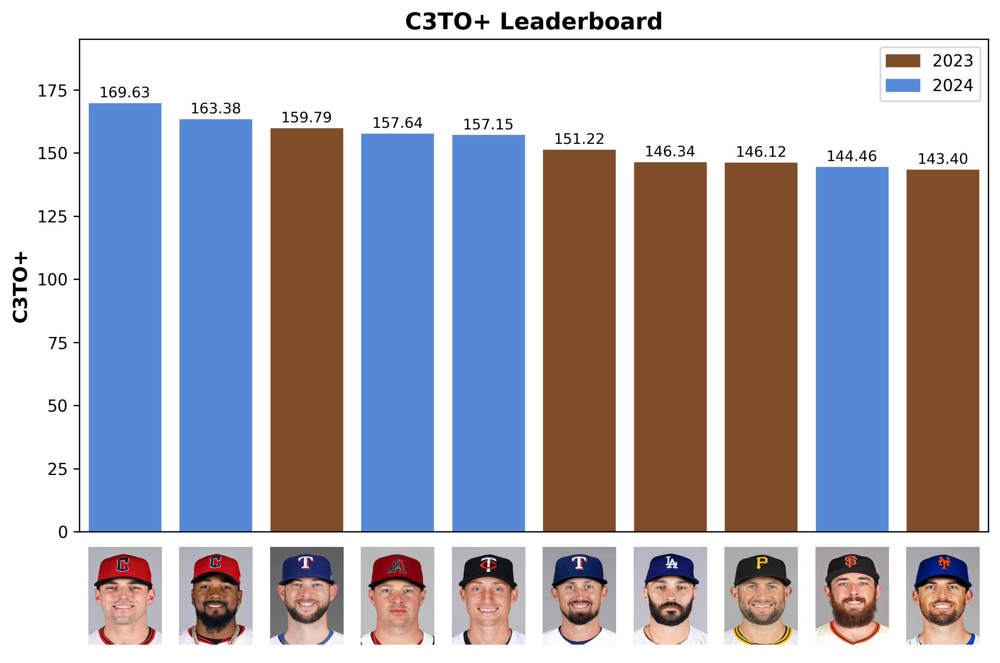

In [ ]:
# Prepare data
df = C3TOtop5both.copy()
df.reset_index(drop=True, inplace=True)

x_positions = np.arange(len(df))
heights = df['C3TO+']

# Assign bar colors
bar_colors = [tufts_brown if s == 2023 else tufts_blue for s in df['Season']]

# Create high-DPI figure
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)  # High DPI for clarity
plt.subplots_adjust(bottom=0.18)

# Draw bars
ax.bar(x_positions, heights, color=bar_colors)

# Place C3TO+ values above bars
for x, c3to_value in zip(x_positions, heights):
    ax.text(
        x, c3to_value + 1,
        f"{c3to_value:.2f}",
        ha='center', va='bottom', fontsize=9
    )

# Remove x-axis labels (since images replace them)
ax.set_xticks([])
ax.set_xlim(-0.5, len(df) - 0.5)

# Adjust y-limits
y_max = heights.max()
ax.set_ylim(0, 1.15 * y_max)

# **Add Title and Y-axis Label**
ax.set_title("C3TO+ Leaderboard", fontsize=14, fontweight='bold')
ax.set_ylabel("C3TO+", fontsize=12, fontweight='bold')

# **Add Legend (Key) to Explain Colors**
legend_patches = [
    mpatches.Patch(color=tufts_brown, label="2023"),
    mpatches.Patch(color=tufts_blue, label="2024")
]
ax.legend(handles=legend_patches, loc='upper right', fontsize=10)  # Correct colors

# Place headshots below the bars with high-quality processing
for i, row in df.iterrows():
    try:
        # Convert image to RGBA & resize with LANCZOS for high-quality scaling
        resized_img = row['image'].convert("RGBA").resize((150, 200), Image.LANCZOS)

        # Convert cleaned image to NumPy array
        np_img = np.array(resized_img)

        # Create OffsetImage with increased zoom for clarity
        imagebox = offsetbox.OffsetImage(np_img, zoom=0.3, resample=True)

        # Place images under bars
        ab = offsetbox.AnnotationBbox(
            imagebox,
            (x_positions[i], -0.15 * y_max),  # Align with bar positions
            xycoords=ax.transData,
            frameon=False
        )
        ax.add_artist(ab)  # Add to plot

    except Exception as e:
        print(f"Could not load image for {row['Name']}: {e}")

# **Save the figure before displaying**
plt.savefig("./drive/MyDrive/Case comp/C3TO+leaderboard.png", dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


In [ ]:
wBB = pd.concat([wBB2023, wBB2024]).sort_values(by='wBB+', ascending=False)
top_5_2023 = (
    wBB[wBB['Season'] == 2023]
    .nlargest(5, 'wBB+')  # pick top 5 by C3TO+
)

# 2. Top 5 for 2024
top_5_2024 = (
    wBB[wBB['Season'] == 2024]
    .nlargest(5, 'wBB+')
)

# 3. Combine
wBBtop5both = pd.concat([top_5_2023, top_5_2024]).sort_values(by='wBB+', ascending=False).reset_index()
wBBtop5both['image'] = wBBtop5both['headshot_url'].apply(fetch_image)

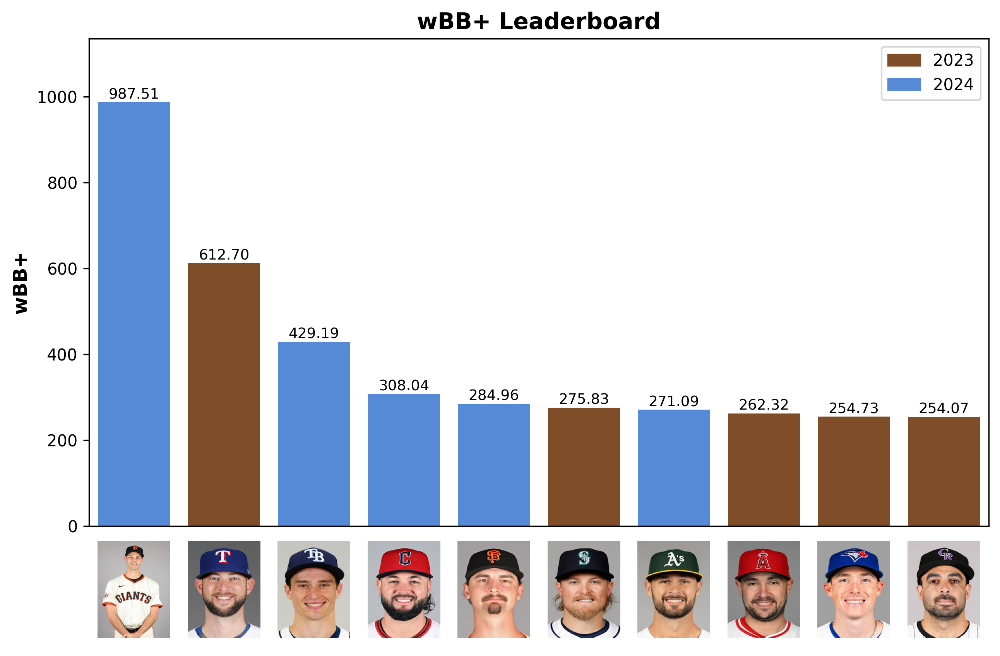

In [ ]:
# Prepare data
df = wBBtop5both.copy()
df.reset_index(drop=True, inplace=True)

x_positions = np.arange(len(df))
heights = df['wBB+']

# Assign bar colors
bar_colors = [tufts_brown if s == 2023 else tufts_blue for s in df['Season']]

# Create high-DPI figure
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)  # High DPI for clarity
plt.subplots_adjust(bottom=0.18)

# Draw bars
ax.bar(x_positions, heights, color=bar_colors)

# Place wBB+ values above bars
for x, wBB_value in zip(x_positions, heights):
    ax.text(
        x, wBB_value + 1,
        f"{wBB_value:.2f}",
        ha='center', va='bottom', fontsize=9
    )

# Remove x-axis labels (since images replace them)
ax.set_xticks([])
ax.set_xlim(-0.5, len(df) - 0.5)

# Adjust y-limits
y_max = heights.max()
ax.set_ylim(0, 1.15 * y_max)

# **Add Title and Y-axis Label**
ax.set_title("wBB+ Leaderboard", fontsize=14, fontweight='bold')
ax.set_ylabel("wBB+", fontsize=12, fontweight='bold')

# **Add Legend (Key) to Explain Colors**
legend_patches = [
    mpatches.Patch(color=tufts_brown, label="2023"),
    mpatches.Patch(color=tufts_blue, label="2024")
]
ax.legend(handles=legend_patches, loc='upper right', fontsize=10)  # Correct colors

# Place headshots below the bars with high-quality processing
for i, row in df.iterrows():
    try:
        # Convert image to RGBA & resize with LANCZOS for high-quality scaling
        resized_img = row['image'].convert("RGBA").resize((150, 200), Image.LANCZOS)

        # Convert cleaned image to NumPy array
        np_img = np.array(resized_img)

        # Create OffsetImage with increased zoom for clarity
        imagebox = offsetbox.OffsetImage(np_img, zoom=0.3, resample=True)

        # Place images under bars
        ab = offsetbox.AnnotationBbox(
            imagebox,
            (x_positions[i], -0.15 * y_max),  # Align with bar positions
            xycoords=ax.transData,
            frameon=False
        )
        ax.add_artist(ab)  # Add to plot

    except Exception as e:
        print(f"Could not load image for {row['Name']}: {e}")

# **Save the figure before displaying**
plt.savefig("./drive/MyDrive/Case comp/wBB+leaderboard.png", dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [ ]:
wK = pd.concat([wK2023, wK2024]).sort_values(by='wK+', ascending=False)
top_5_2023 = (
    wK[wK['Season'] == 2023]
    .nlargest(5, 'wK+')  # pick top 5 by C3TO+
)

# 2. Top 5 for 2024
top_5_2024 = (
    wK[wK['Season'] == 2024]
    .nlargest(5, 'wK+')
)

# 3. Combine
wKtop5both = pd.concat([top_5_2023, top_5_2024]).sort_values(by='wK+', ascending=False).reset_index()
wKtop5both['image'] = wKtop5both['headshot_url'].apply(fetch_image)

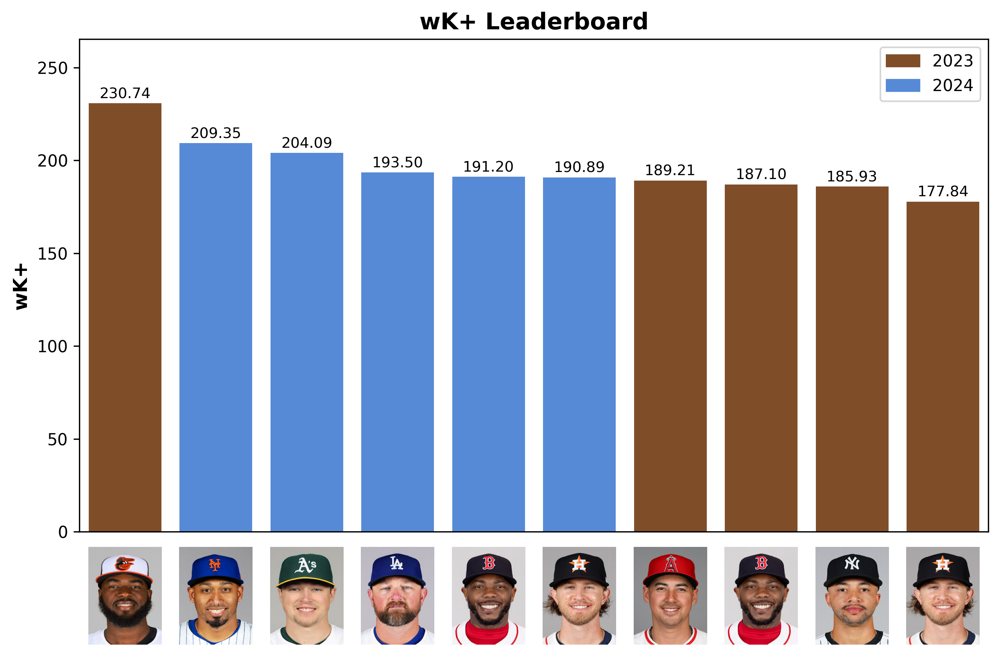

In [ ]:
# Prepare data
df = wKtop5both.copy()
df.reset_index(drop=True, inplace=True)

x_positions = np.arange(len(df))
heights = df['wK+']

# Assign bar colors
bar_colors = [tufts_brown if s == 2023 else tufts_blue for s in df['Season']]

# Create high-DPI figure
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)  # High DPI for clarity
plt.subplots_adjust(bottom=0.18)

# Draw bars
ax.bar(x_positions, heights, color=bar_colors)

# Place wK+ values above bars
for x, sK_value in zip(x_positions, heights):
    ax.text(
        x, sK_value + 1,
        f"{sK_value:.2f}",
        ha='center', va='bottom', fontsize=9
    )

# Remove x-axis labels (since images replace them)
ax.set_xticks([])
ax.set_xlim(-0.5, len(df) - 0.5)

# Adjust y-limits
y_max = heights.max()
ax.set_ylim(0, 1.15 * y_max)

# **Add Title and Y-axis Label**
ax.set_title("wK+ Leaderboard", fontsize=14, fontweight='bold')
ax.set_ylabel("wK+", fontsize=12, fontweight='bold')

# **Add Legend (Key) to Explain Colors**
legend_patches = [
    mpatches.Patch(color=tufts_brown, label="2023"),
    mpatches.Patch(color=tufts_blue, label="2024")
]
ax.legend(handles=legend_patches, loc='upper right', fontsize=10)  # Correct colors

# Place headshots below the bars with high-quality processing
for i, row in df.iterrows():
    try:
        # Convert image to RGBA & resize with LANCZOS for high-quality scaling
        resized_img = row['image'].convert("RGBA").resize((150, 200), Image.LANCZOS)

        # Convert cleaned image to NumPy array
        np_img = np.array(resized_img)

        # Create OffsetImage with increased zoom for clarity
        imagebox = offsetbox.OffsetImage(np_img, zoom=0.3, resample=True)

        # Place images under bars
        ab = offsetbox.AnnotationBbox(
            imagebox,
            (x_positions[i], -0.15 * y_max),  # Align with bar positions
            xycoords=ax.transData,
            frameon=False
        )
        ax.add_artist(ab)  # Add to plot

    except Exception as e:
        print(f"Could not load image for {row['Name']}: {e}")

# **Save the figure before displaying**
plt.savefig("./drive/MyDrive/Case comp/wK+leaderboard.png", dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [ ]:
ws2023["Season"] = 2023
ws2024["Season"] = 2024
ws = pd.concat([ws2023, ws2024]).sort_values(by='Weighted Saves', ascending=False)
top_5_2023 = (
    ws[ws['Season'] == 2023]
    .nlargest(5, 'Weighted Saves')  # pick top 5 by C3TO+
)

# 2. Top 5 for 2024
top_5_2024 = (
    ws[ws['Season'] == 2024]
    .nlargest(5, 'Weighted Saves')
)

# 3. Combine
wstop5both = pd.concat([top_5_2023, top_5_2024]).sort_values(by='Weighted Saves', ascending=False).reset_index()
wstop5both['image'] = wstop5both['headshot_url'].apply(fetch_image)

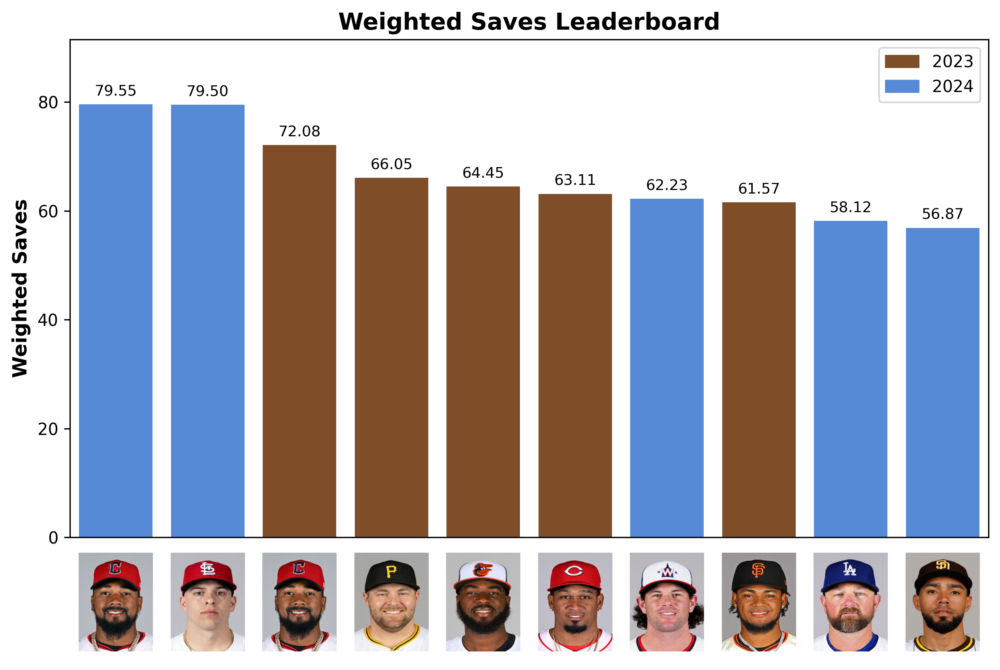

In [ ]:
# Prepare data
df = wstop5both.copy()
df.reset_index(drop=True, inplace=True)

x_positions = np.arange(len(df))
heights = df['Weighted Saves']

# Assign bar colors
bar_colors = [tufts_brown if s == 2023 else tufts_blue for s in df['Season']]

# Create high-DPI figure
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)  # High DPI for clarity
plt.subplots_adjust(bottom=0.18)

# Draw bars
ax.bar(x_positions, heights, color=bar_colors)

# Place ws values above bars
for x, ws_value in zip(x_positions, heights):
    ax.text(
        x, ws_value + 1,
        f"{ws_value:.2f}",
        ha='center', va='bottom', fontsize=9
    )

# Remove x-axis labels (since images replace them)
ax.set_xticks([])
ax.set_xlim(-0.5, len(df) - 0.5)

# Adjust y-limits
y_max = heights.max()
ax.set_ylim(0, 1.15 * y_max)

# **Add Title and Y-axis Label**
ax.set_title("Weighted Saves Leaderboard", fontsize=14, fontweight='bold')
ax.set_ylabel("Weighted Saves", fontsize=12, fontweight='bold')

# **Add Legend (Key) to Explain Colors**
legend_patches = [
    mpatches.Patch(color=tufts_brown, label="2023"),
    mpatches.Patch(color=tufts_blue, label="2024")
]
ax.legend(handles=legend_patches, loc='upper right', fontsize=10)  # Correct colors

# Place headshots below the bars with high-quality processing
for i, row in df.iterrows():
    try:
        # Convert image to RGBA & resize with LANCZOS for high-quality scaling
        resized_img = row['image'].convert("RGBA").resize((150, 200), Image.LANCZOS)

        # Convert cleaned image to NumPy array
        np_img = np.array(resized_img)

        # Create OffsetImage with increased zoom for clarity
        imagebox = offsetbox.OffsetImage(np_img, zoom=0.3, resample=True)

        # Place images under bars
        ab = offsetbox.AnnotationBbox(
            imagebox,
            (x_positions[i], -0.15 * y_max),  # Align with bar positions
            xycoords=ax.transData,
            frameon=False
        )
        ax.add_artist(ab)  # Add to plot

    except Exception as e:
        print(f"Could not load image for {row['Name']}: {e}")

# **Save the figure before displaying**
plt.savefig("./drive/MyDrive/Case comp/weighted_saves_leaderboard.png", dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

In [ ]:
ws

,Name,Weighted Saves,pitcher,headshot_url,Season
0,"Clase, Emmanuel",79.547574,661403,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/661403/headshot/67/current",2024
1,"Helsley, Ryan",79.504308,664854,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/664854/headshot/67/current",2024
0,"Clase, Emmanuel",72.078799,661403,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/661403/headshot/67/current",2023
1,"Bednar, David",66.051113,670280,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/670280/headshot/67/current",2023
2,"Bautista, Félix",64.450772,642585,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/642585/headshot/67/current",2023
...,...,...,...,...,...
445,"Patton, Spencer",0.000000,607359,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/607359/headshot/67/current",2023
446,"Norris, Daniel",0.000000,596057,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/596057/headshot/67/current",2023
447,"Nittoli, Vinny",0.000000,657697,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/657697/headshot/67/current",2023
448,"Seabold, Connor",0.000000,657756,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/657756/headshot/67/current",2023


In [ ]:
C3TOtop5both

,index,Name,C3TO+,headshot_url,Season,image
0,1,Cade Smith,169.626299,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/671922/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1F34A710>
1,5,Emmanuel Clase,163.379335,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/661403/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDEBD58FD50>
2,18,Chris Martin,159.787454,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/455119/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1F284150>
3,31,Joe Mantiply,157.636417,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/573009/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDEBC921150>
4,2,Griffin Jax,157.149539,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/643377/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF18C95B10>
5,33,Shawn Armstrong,151.219213,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/542888/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDEBD619350>
6,0,Tanner Scott,146.342453,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/656945/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF213EB510>
7,32,Tim Mayza,146.120754,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/641835/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDEBD557F90>
8,11,Ryan Walker,144.459764,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/676254/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1BBBEF50>
9,15,Clay Holmes,143.397526,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/605280/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1ADB6990>


In [ ]:
wKtop5both

,index,Name,wK+,headshot_url,Season,image
0,1,Felix Bautista,230.737444,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/642585/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF12DA4DD0>
1,38,Edwin Diaz,209.348921,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/621242/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF106584D0>
2,4,Mason Miller,204.087042,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/695243/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF124A4510>
3,8,Kirby Yates,193.496243,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/489446/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF124BB390>
4,40,Aroldis Chapman,191.199039,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/547973/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1062B790>
5,55,Josh Hader,190.888171,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/623352/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF10600310>
6,61,Robert Stephenson,189.214490,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/596112/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1ADB6850>
7,11,Aroldis Chapman,187.095937,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/547973/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF18545D50>
8,10,Devin Williams,185.925510,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/642207/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF12D37450>
9,13,Josh Hader,177.840784,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/623352/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF12D34390>


In [ ]:
wBBtop5both

,index,Name,wBB+,headshot_url,Season,image
0,84,Tyler Rogers,987.514253,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/643511/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDEBD600FD0>
1,18,Chris Martin,612.704838,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/455119/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF124B4B90>
2,64,Kevin Kelly,429.186712,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/687330/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF124CE510>
3,60,Jakob Junis,308.037286,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/596001/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF12D10910>
4,115,Sean Hjelle,284.960458,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/663546/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1F34A010>
5,102,Gabe Speier,275.833511,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/642100/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF12DC1390>
6,152,Kyle Muller,271.089490,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/666205/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF13FEBC10>
7,166,Brock Burke,262.321915,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/656271/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF12A360D0>
8,68,Ryan Yarbrough,254.729963,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/642232/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF10315AD0>
9,87,Scott Alexander,254.069656,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/518397/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF124BFE10>


In [ ]:
wstop5both

,index,Name,Weighted Saves,pitcher,headshot_url,Season,image
0,0,"Clase, Emmanuel",79.547574,661403,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/661403/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1366BB90>
1,1,"Helsley, Ryan",79.504308,664854,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/664854/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF124AE050>
2,0,"Clase, Emmanuel",72.078799,661403,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/661403/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF106914D0>
3,1,"Bednar, David",66.051113,670280,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/670280/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF124BE9D0>
4,2,"Bautista, Félix",64.450772,642585,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/642585/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1063CA10>
5,3,"Díaz, Alexis",63.108629,664747,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/664747/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1362F590>
6,2,"Finnegan, Kyle",62.232933,640448,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/640448/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF13632090>
7,4,"Doval, Camilo",61.565111,666808,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/666808/headshot/67/current",2023,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF13631B50>
8,3,"Yates, Kirby",58.119645,489446,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/489446/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF106C8D50>
9,4,"Suarez, Robert",56.867373,663158,"https://img.mlbstatic.com/mlb-photos/image/upload/d_people:generic:headshot:67:current.png/w_213,q_auto:best/v1/people/663158/headshot/67/current",2024,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1065BD90>


In [ ]:
qualified_relievers = pd.concat([qualified_relievers_2023, qualified_relievers_2024])
ws2023["Season"] = 2023
ws2024["Season"] = 2024
ws = pd.concat([ws2023, ws2024]).sort_values(by='Weighted Saves', ascending=False)
qualified_relievers_with_ws = qualified_relievers.merge(
    ws[['pitcher', 'Weighted Saves', 'Season']],
    left_on=['key_mlbam', 'Season'],
    right_on=['pitcher', 'Season'],
    how='left', suffixes=('', 'y')
)

In [ ]:
qualified_relievers_with_ws.reset_index(drop=True, inplace=True)
qualified_relievers_with_ws['Weighted Saves'].fillna(0, inplace=True)
qualified_relievers_with_ws['SS+'].fillna(0, inplace=True)
qualified_relievers_with_ws['SBB+'].fillna(0, inplace=True)
qualified_relievers_with_ws['C3TO+'].fillna(0, inplace=True)

<ipython-input-99-01b6c073d81f>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


<ipython-input-99-01b6c073d81f>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col

In [ ]:
qualified_relievers_with_ws['image'] = qualified_relievers_with_ws['headshot_url'].apply(
    lambda url: fetch_image(url))

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

In [ ]:
def plot_images_at_points(x, y, images, seasons, ax=None):
    from PIL import Image
    from matplotlib.offsetbox import OffsetImage, AnnotationBbox
    import numpy as np

    if ax is None:
        ax = plt.gca()

    # Define frame colors based on season
    season_colors = {2024: tufts_blue, 2023: tufts_brown}

    for xi, yi, image, season in zip(x, y, images, seasons):
        try:
            # Ensure image is a PIL Image and resize with high-quality LANCZOS filter
            image = image.convert("RGBA").resize((150, 200), Image.LANCZOS)

            # Convert image to NumPy array for better rendering
            np_img = np.array(image)

            # Determine frame color based on season
            frame_color = season_colors.get(season, "gray")  # Default to gray if unknown season

            # Create OffsetImage with improved interpolation
            im = OffsetImage(np_img, zoom=0.1, interpolation="bilinear", resample=True)

            # Attach image with a frame
            ab = AnnotationBbox(im, (xi, yi), frameon=True, pad=0.1, bboxprops=dict(edgecolor=frame_color, linewidth=1))
            ax.add_artist(ab)

        except Exception as e:
            print(f"Error processing image: {e}")

In [ ]:
qualified_relievers_with_ws['K%']=qualified_relievers_with_ws['K%']*100


In [ ]:
qualified_relievers_with_ws['BB%']=qualified_relievers_with_ws['BB%']*100

In [ ]:
qualified_relievers_with_ws.rename(columns={'SS+': 'wK+'}, inplace=True)

In [ ]:
qualified_relievers_with_ws.rename(columns={'SBB+': 'wBB+'}, inplace=True)

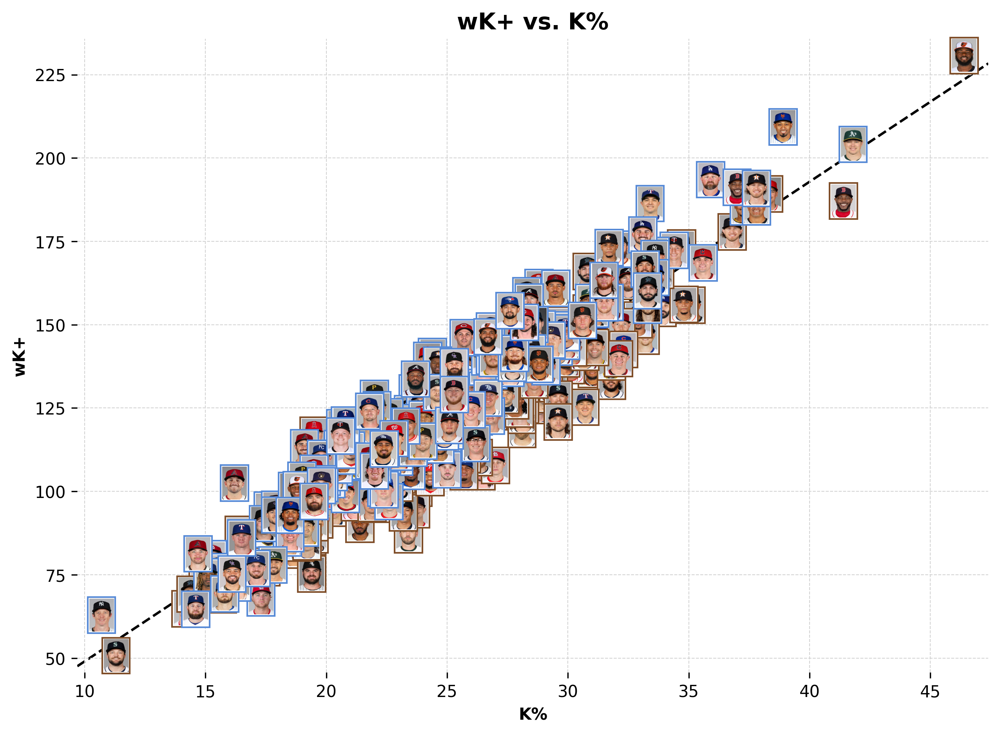

In [ ]:
qualified_sorted = qualified_relievers_with_ws[qualified_relievers_with_ws['wK+']!=0]

# Set DPI to 300 for higher resolution
fig, ax = plt.subplots(figsize=(10, 7), dpi=300)
# Plot colored dots by Season
season_colors = {2024: tufts_blue, 2023: tufts_brown}
colors_mapped = qualified_sorted['Season'].map(season_colors)
colors_mapped.fillna('gray', inplace=True)

# Scatter plot (above images, below text)
ax.scatter(
    qualified_sorted['K%'],
    qualified_sorted['wK+'],
    c=colors_mapped,
    s=50, alpha=0.7, label='Other players',
    zorder=2  # Above images, behind text
)

# Plot images (now behind axes labels but in front of line)
plot_images_at_points(
    qualified_sorted['K%'],
    qualified_sorted['wK+'],
    qualified_sorted['image'],
    qualified_sorted['Season'],
    ax=ax
)
# Line of best fit (above images but behind labels)

ax.set_xlim(qualified_sorted['K%'].min() - 1, qualified_sorted['K%'].max() + 1)
ax.set_ylim(qualified_sorted['wK+'].min() - 5, qualified_sorted['wK+'].max() + 5)
# Add faint grid lines behind everything
ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray', zorder=-1)

# Remove all plot borders (spines)
for spine in ax.spines.values():
    spine.set_visible(False)
# Ensure the grid is behind everything
ax.set_axisbelow(True)
# Axes labels and title (highest z-order)
ax.set_xlabel('K%', fontweight='bold', zorder=4)
ax.set_ylabel('wK+', fontweight='bold', zorder=4)
m, b = np.polyfit(
    qualified_relievers_with_ws['K%'],
    qualified_relievers_with_ws['wK+'],
    deg=1
)
x_vals = np.array(ax.get_xlim())
y_vals = m * x_vals + b
ax.plot(
    x_vals, y_vals,
    color="black", linewidth=1.5, linestyle='--',
    label='Line of best fit', alpha=1,
    zorder=0  # Above images and scatter, but below labels
)
plt.title('wK+ vs. K%', fontsize=14, fontweight='bold', zorder=4)
plt.savefig("./drive/MyDrive/Case comp/PlotK%_vs_wK+.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

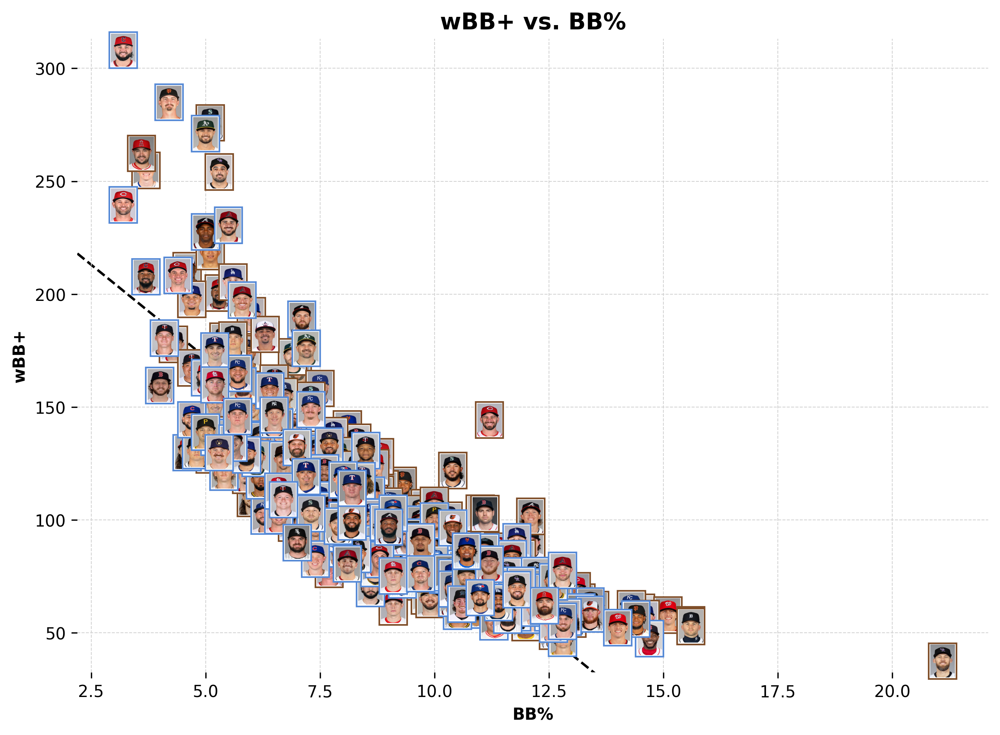

In [ ]:
qualified_sorted = qualified_relievers_with_ws[(qualified_relievers_with_ws['wBB+']!=0) & (qualified_relievers_with_ws['wBB+']<400)]

# Set DPI to 300 for higher resolution
fig, ax = plt.subplots(figsize=(10, 7), dpi=300)
# Plot colored dots by Season
season_colors = {2024: tufts_blue, 2023: tufts_brown}
colors_mapped = qualified_sorted['Season'].map(season_colors)
colors_mapped.fillna('gray', inplace=True)

# Scatter plot (above images, below text)
ax.scatter(
    qualified_sorted['BB%'],
    qualified_sorted['wBB+'],
    c=colors_mapped,
    s=50, alpha=0.7, label='Other players',
    zorder=2  # Above images, behind text
)

# Plot images (now behind axes labels but in front of line)
plot_images_at_points(
    qualified_sorted['BB%'],
    qualified_sorted['wBB+'],
    qualified_sorted['image'],
    qualified_sorted['Season'],
    ax=ax
)
# Line of best fit (above images but behind labels)

ax.set_xlim(qualified_sorted['BB%'].min() - 1, qualified_sorted['BB%'].max() + 1)
ax.set_ylim(qualified_sorted['wBB+'].min() - 5, qualified_sorted['wBB+'].max() + 5)
# Add faint grid lines behind everything
ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray', zorder=-1)

# Remove all plot borders (spines)
for spine in ax.spines.values():
    spine.set_visible(False)
# Ensure the grid is behind everything
ax.set_axisbelow(True)
# Axes labels and title (highest z-order)
ax.set_xlabel('BB%', fontweight='bold', zorder=4)
ax.set_ylabel('wBB+', fontweight='bold', zorder=4)
m, b = np.polyfit(
    qualified_relievers_with_ws['BB%'],
    qualified_relievers_with_ws['wBB+'],
    deg=1
)
x_vals = np.array(ax.get_xlim())
y_vals = m * x_vals + b
ax.plot(
    x_vals, y_vals,
    color="black", linewidth=1.5, linestyle='--',
    label='Line of best fit', alpha=1,
    zorder=0  # Above images and scatter, but below labels
)
plt.title('wBB+ vs. BB%', fontsize=14, fontweight='bold', zorder=4)
plt.savefig("./drive/MyDrive/Case comp/PlotBB%_vs_wBB+.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

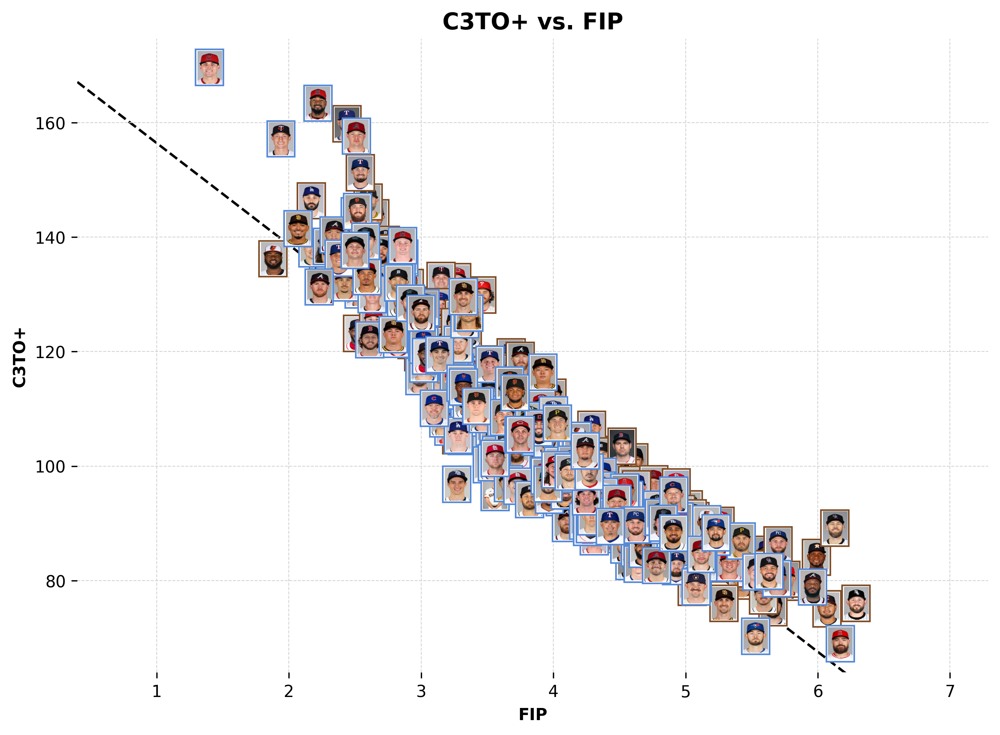

In [ ]:
qualified_sorted = qualified_relievers_with_ws[(qualified_relievers_with_ws['C3TO+']!=0)]

# Set DPI to 300 for higher resolution
fig, ax = plt.subplots(figsize=(10, 7), dpi=300)
# Plot colored dots by Season
season_colors = {2024: tufts_blue, 2023: tufts_brown}
colors_mapped = qualified_sorted['Season'].map(season_colors)
colors_mapped.fillna('gray', inplace=True)

# Scatter plot (above images, below text)
ax.scatter(
    qualified_sorted['FIP'],
    qualified_sorted['C3TO+'],
    c=colors_mapped,
    s=50, alpha=0.7, label='Other players',
    zorder=2  # Above images, behind text
)

# Plot images (now behind axes labels but in front of line)
plot_images_at_points(
    qualified_sorted['FIP'],
    qualified_sorted['C3TO+'],
    qualified_sorted['image'],
    qualified_sorted['Season'],
    ax=ax
)
# Line of best fit (above images but behind labels)

ax.set_xlim(qualified_sorted['FIP'].min() - 1, qualified_sorted['FIP'].max() + 1)
ax.set_ylim(qualified_sorted['C3TO+'].min() - 5, qualified_sorted['C3TO+'].max() + 5)
# Add faint grid lines behind everything
ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray', zorder=-1)

# Remove all plot borders (spines)
for spine in ax.spines.values():
    spine.set_visible(False)
# Ensure the grid is behind everything
ax.set_axisbelow(True)
# Axes labels and title (highest z-order)
ax.set_xlabel('FIP', fontweight='bold', zorder=4)
ax.set_ylabel('C3TO+', fontweight='bold', zorder=4)
m, b = np.polyfit(
    qualified_relievers_with_ws['FIP'],
    qualified_relievers_with_ws['C3TO+'],
    deg=1
)
x_vals = np.array(ax.get_xlim())
y_vals = m * x_vals + b
ax.plot(
    x_vals, y_vals,
    color="black", linewidth=1.5, linestyle='--',
    label='Line of best fit', alpha=1,
    zorder=0  # Above images and scatter, but below labels
)
plt.title('C3TO+ vs. FIP', fontsize=14, fontweight='bold', zorder=4)
plt.savefig("./drive/MyDrive/Case comp/PlotFIP_vs_C3TO++.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

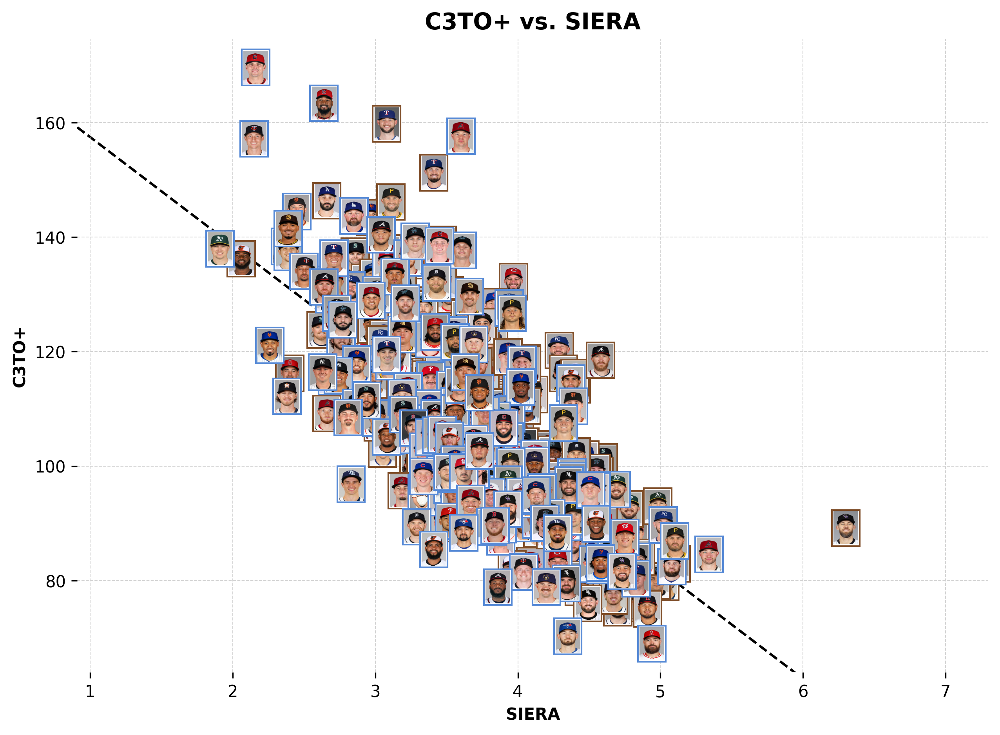

In [ ]:
qualified_sorted = qualified_relievers_with_ws[(qualified_relievers_with_ws['C3TO+']!=0)]

# Set DPI to 300 for higher resolution
fig, ax = plt.subplots(figsize=(10, 7), dpi=300)
# Plot colored dots by Season
season_colors = {2024: tufts_blue, 2023: tufts_brown}
colors_mapped = qualified_sorted['Season'].map(season_colors)
colors_mapped.fillna('gray', inplace=True)

# Scatter plot (above images, below text)
ax.scatter(
    qualified_sorted['SIERA'],
    qualified_sorted['C3TO+'],
    c=colors_mapped,
    s=50, alpha=0.7, label='Other players',
    zorder=2  # Above images, behind text
)

# Plot images (now behind axes labels but in front of line)
plot_images_at_points(
    qualified_sorted['SIERA'],
    qualified_sorted['C3TO+'],
    qualified_sorted['image'],
    qualified_sorted['Season'],
    ax=ax
)
# Line of best fit (above images but behind labels)

ax.set_xlim(qualified_sorted['SIERA'].min() - 1, qualified_sorted['SIERA'].max() + 1)
ax.set_ylim(qualified_sorted['C3TO+'].min() - 5, qualified_sorted['C3TO+'].max() + 5)
# Add faint grid lines behind everything
ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgray', zorder=-1)

# Remove all plot borders (spines)
for spine in ax.spines.values():
    spine.set_visible(False)
# Ensure the grid is behind everything
ax.set_axisbelow(True)
# Axes labels and title (highest z-order)
ax.set_xlabel('SIERA', fontweight='bold', zorder=4)
ax.set_ylabel('C3TO+', fontweight='bold', zorder=4)
m, b = np.polyfit(
    qualified_relievers_with_ws['SIERA'],
    qualified_relievers_with_ws['C3TO+'],
    deg=1
)
x_vals = np.array(ax.get_xlim())
y_vals = m * x_vals + b
ax.plot(
    x_vals, y_vals,
    color="black", linewidth=1.5, linestyle='--',
    label='Line of best fit', alpha=1,
    zorder=0  # Above images and scatter, but below labels
)
plt.title('C3TO+ vs. SIERA', fontsize=14, fontweight='bold', zorder=4)
plt.savefig("./drive/MyDrive/Case comp/PlotSIERA_vs_C3TO++.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()

In [ ]:
qualified_relievers_with_ws2023= qualified_relievers_with_ws[qualified_relievers_with_ws['Season']==2023]
qualified_relievers_with_ws2024= qualified_relievers_with_ws[qualified_relievers_with_ws['Season']==2024]

In [ ]:
qualified_relievers_with_ws2023[qualified_relievers_with_ws2023['pitcher']==608032][['wK+','wBB+','C3TO+']]

,wK+,wBB+,C3TO+
73,149.848519,79.240502,110.305412


In [ ]:
qualified_relievers_with_ws = qualified_relievers_with_ws2023.merge(
    qualified_relievers_with_ws2024,  # Selecting relevant columns
    on='pitcher',
    how='inner',
    suffixes=('2023', '2024')  # Adding a suffix to distinguish the new column
)

In [ ]:
qualified_relievers_with_ws['FIP_diff'] = np.abs(
    qualified_relievers_with_ws['FIP2024'] - qualified_relievers_with_ws['FIP2023'])
qualified_relievers_with_ws['SIERA_diff'] = np.abs(
    qualified_relievers_with_ws['SIERA2024'] - qualified_relievers_with_ws['SIERA2023'])
qualified_relievers_with_ws['C3TO+_diff'] = np.abs(
    qualified_relievers_with_ws['C3TO+2024'] - qualified_relievers_with_ws['C3TO+2023'])
qualified_relievers_with_ws['ERA_diff'] = np.abs(
    qualified_relievers_with_ws['ERA2024'] - qualified_relievers_with_ws['ERA2023'])

In [ ]:
qualified_relievers_with_ws['C3TO+_diff'].median()/((qualified_relievers_with_ws['C3TO+2023'].std()+qualified_relievers_with_ws['C3TO+2024'].std())/2)

0.7194022757258838

In [ ]:
from scipy.stats import pearsonr

In [ ]:
# Assuming you have a DataFrame 'qualified_relievers_with_ws' with FIP data for 2023 and 2024
df = qualified_relievers_with_ws  # Rename for clarity

# Drop rows where FIP values are missing in either year
df = df.dropna(subset=['C3TO+2023', 'C3TO+2024'])

# Compute Pearson correlation coefficient and p-value
pearson_coef, p_value = pearsonr(df['C3TO+2023'], df['C3TO+2024'])

# Print results
print(f"Pearson Correlation Coefficient: {pearson_coef:.4f}")
print(f"P-value: {p_value:.4f}")

Pearson Correlation Coefficient: 0.3046
P-value: 0.0039


In [ ]:
qualified_relievers_with_ws

,IDfg2023,Season2023,Name2023,Team2023,Age2023,W2023,L2023,WAR2023,ERA2023,G2023,...,image2024,FIP_diff,ERA_diff,wK+_diff,wBB+_diff,K%_diff,BB%_diff,C3TO+_diff,FIP-_diff,SIERA_diff
0,17586,2023,Tanner Scott,MIA,28,9,5,2.8,2.31,74,...,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF19155250>,0.345622,0.320000,0.000603,1.025423,0.185315,0.564103,0.191010,0.469388,0.334586
1,19569,2023,David Bednar,PIT,28,3,3,2.3,2.00,66,...,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF124BBCD0>,0.897233,1.885000,0.088820,0.438920,0.307692,0.407895,0.504315,1.034483,0.289634
2,13799,2023,Matt Strahm,PHI,31,9,5,2.0,3.29,56,...,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF13612310>,0.414847,0.759358,0.014865,0.185278,0.081169,0.304348,0.202649,0.285714,0.308017
3,21992,2023,Camilo Doval,SFG,25,6,6,1.9,2.93,69,...,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1912F250>,0.339350,0.665529,0.011480,1.054530,0.076389,0.548387,0.111980,0.439394,0.195513
4,21132,2023,Alexis Diaz,CIN,26,9,6,1.8,3.07,71,...,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF19139350>,0.298295,0.299674,0.187953,0.192411,0.325991,0.015873,0.188054,0.394737,0.191489
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,9073,2023,Kirby Yates,ATL,36,7,2,-0.2,3.28,61,...,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF13FFA450>,0.852000,1.803419,0.181720,0.604023,0.139683,0.237288,0.496318,0.830508,0.368421
84,20517,2023,Nick Sandlin,CLE,26,5,5,-0.3,3.75,61,...,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF190D6F90>,0.054435,0.000000,0.117674,0.228397,0.000000,0.100000,0.038029,0.111111,0.019337
85,26304,2023,Bryan Hoeing,MIA,26,2,3,-0.3,5.48,33,...,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF1911F710>,0.593373,1.513761,0.337610,0.105413,0.178161,0.223881,0.704952,0.475610,0.295082
86,27581,2023,Hayden Wesneski,CHC,25,3,5,-0.4,4.63,34,...,<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=213x320 at 0x7EDF13F64F50>,0.215078,0.199482,0.191771,0.032484,0.082192,0.135135,0.103550,0.132743,0.152000


In [ ]:
qualified_relievers_with_ws.columns.to_list()

['IDfg2023',
 'Season2023',
 'Name2023',
 'Team2023',
 'Age2023',
 'W2023',
 'L2023',
 'WAR2023',
 'ERA2023',
 'G2023',
 'GS2023',
 'CG2023',
 'ShO2023',
 'SV2023',
 'BS2023',
 'IP2023',
 'TBF2023',
 'H2023',
 'R2023',
 'ER2023',
 'HR2023',
 'BB2023',
 'IBB2023',
 'HBP2023',
 'WP2023',
 'BK2023',
 'SO2023',
 'GB2023',
 'FB2023',
 'LD2023',
 'IFFB2023',
 'Balls2023',
 'Strikes2023',
 'Pitches2023',
 'RS2023',
 'IFH2023',
 'BU2023',
 'BUH2023',
 'K/92023',
 'BB/92023',
 'K/BB2023',
 'H/92023',
 'HR/92023',
 'AVG2023',
 'WHIP2023',
 'BABIP2023',
 'LOB%2023',
 'FIP2023',
 'GB/FB2023',
 'LD%2023',
 'GB%2023',
 'FB%2023',
 'IFFB%2023',
 'HR/FB2023',
 'IFH%2023',
 'BUH%2023',
 'Starting2023',
 'Start-IP2023',
 'Relieving2023',
 'Relief-IP2023',
 'RAR2023',
 'Dollars2023',
 'tERA2023',
 'xFIP2023',
 'WPA2023',
 '-WPA2023',
 '+WPA2023',
 'RE242023',
 'REW2023',
 'pLI2023',
 'inLI2023',
 'gmLI2023',
 'exLI2023',
 'Pulls2023',
 'WPA/LI2023',
 'Clutch2023',
 'FB% 22023',
 'FBv2023',
 'SL%2023',
 '

In [ ]:
qualified_relievers_with_ws.sort_values(by='C3TO+2023', ascending=False)['C3TO+2023']

,C3TO+2023
19,151.219213
0,146.342453
9,143.397526
13,138.746510
25,137.207357
...,...
70,87.977577
86,83.653172
72,82.764773
87,80.226734
